# <center>ĐỒ ÁN THỰC HÀNH #2: PHÂN TÍCH DỮ LIỆU ỨNG DỤNG</center>

| MSSV     | Họ và tên         | Đánh giá |
|----------|-------------------|----------|
| 19120539 | Vương Thế Khang   | 100%     |
| 19120555 | Nguyễn Chánh Kiệt | 100%     |
| 19120652 | Nguyễn Trọng Thái | 100%     |
| 19120699 | Ngô Mậu Trường    | 100%     |

**Link colab:** https://colab.research.google.com/drive/1c7TJLJO5oJf25xKeLCfA23YESS1nvVjq?usp=sharing

## Import

In [1]:
# Imporant libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import re
import pydotplus
import warnings
import statsmodels.api as sm

# More libraries
from matplotlib.colors import ListedColormap
from math import sqrt
from six import StringIO
from IPython.display import Image

# Config pandas
pd.set_option('display.max_rows', 500)
pd.set_option('mode.chained_assignment', None)

# Config warning
warnings.simplefilter(action = 'ignore', category = FutureWarning)
warnings.filterwarnings(action = 'ignore', category = DeprecationWarning)

# Statsmodels
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf

# Sklearn
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, ConfusionMatrixDisplay
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# A. THU THẬP DỮ LIỆU

Bộ dữ liệu mà nhóm sẽ thực hiện trong đồ án lần này là bộ dữ liệu về thông tin các phòng ở, nhà nghỉ, khách sạn, căn hộ, cho phép người dùng đặt và cho thuê tùy theo nhu cầu cá nhân riêng biệt. Dữ liệu được thu thập từ nền tảng đặt và cho thuê phòng [Airbnb](airbnb.com.vn) thuộc sở hữu của công ty Airbnb. Theo như mô tả về dữ liệu như sau:
> Inside Airbnb is an independent, non-commercial set of tools and data that allows you to explore how Airbnb is really being used in cities around the world. By analyzing publicly available information about a city's Airbnb's listings, Inside Airbnb provides filters and key metrics so you can see how Airbnb is being used to compete with the residential housing market.

Ở đây ta có 2 file dữ liệu bao gồm:
- File "AB_NYC_2019.csv": bộ dữ liệu được lấy từ nguồn [Source](https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data) trên Kaggle ở bài tập DATH#1.
- File "dbo_airbnb-listings.csv": bộ dữ liệu được lấy từ nguồn [Source](https://public.opendatasoft.com/explore/dataset/airbnb-listings/table/?disjunctive.host_verifications&disjunctive.amenities&disjunctive.features&dataChart=eyJxdWVyaWVzIjpbeyJjaGFydHMiOlt7InR5cGUiOiJjb2x1bW4iLCJmdW5jIjoiQ09VTlQiLCJ5QXhpcyI6Imhvc3RfbGlzdGluZ3NfY291bnQiLCJzY2llbnRpZmljRGlzcGxheSI6dHJ1ZSwiY29sb3IiOiJyYW5nZS1jdXN0b20ifV0sInhBeGlzIjoiY2l0eSIsIm1heHBvaW50cyI6IiIsInRpbWVzY2FsZSI6IiIsInNvcnQiOiIiLCJzZXJpZXNCcmVha2Rvd24iOiJyb29tX3R5cGUiLCJjb25maWciOnsiZGF0YXNldCI6ImFpcmJuYi1saXN0aW5ncyIsIm9wdGlvbnMiOnsiZGlzanVuY3RpdmUuaG9zdF92ZXJpZmljYXRpb25zIjp0cnVlLCJkaXNqdW5jdGl2ZS5hbWVuaXRpZXMiOnRydWUsImRpc2p1bmN0aXZlLmZlYXR1cmVzIjp0cnVlfX19XSwidGltZXNjYWxlIjoiIiwiZGlzcGxheUxlZ2VuZCI6dHJ1ZSwiYWxpZ25Nb250aCI6dHJ1ZX0%3D) và đã được qua xử lý loại bỏ các trường có dữ liệu nặng và không cần thiết, nhằm giảm bớt một phần dung lượng của dữ liệu.

Nói thêm, theo thông tin từ nguồn trên, dữ liệu của Inside Airbnb được lấy từ API có sẵn công khai của Airbnb và đã được phân tích, làm sạch và tổng hợp cho người dùng.

Một số thông tin quan trọng về dữ liệu:
- File "AB_NYC_2019.csv":
  - Công khai bởi: Dgomonov
  - Giấy phép: [CC0 1.0 Universal (CC0 1.0) Public Domain Dedication](https://creativecommons.org/publicdomain/zero/1.0/)
- File "dbo_airbnb-listings.csv":
  - Công khai bởi: Inside Airbnb
  - Giấy phép: [CC0 1.0 Universal (CC0 1.0) Public Domain Dedication](https://creativecommons.org/publicdomain/zero/1.0/)

Đầu tiên, ta sẽ xem thử bộ dữ liệu trông như thế nào. Đọc dữ liệu từ file "AB_NYC_2019.csv" và "listings.csv" và lưu vào 2 dataframe `df1` và `df2`.

In [3]:
df1 = pd.read_csv('/content/drive/MyDrive/AB_NYC_2019.csv')
df1.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [4]:
df2 = pd.read_csv('/content/drive/MyDrive/dbo_airbnb-listings.csv')
df2.head()

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,ID,Scrape ID,Last Scraped,Name,Experiences Offered,Host ID,Host Name,Host Since,Host Location,Host Response Time,...,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation
0,17619081.0,2.017062e+13,6/15/2017,Nice smallroom i central old Frederiksberg,none,39150424,Birgitte,7/21/2015,"Frederiksberg, Capital Region of Denmark, Denmark",within an hour,...,10.0,10.0,8.0,10.0,NaN,NaN,flexible,2.0,0.66,"55.67597935514723,12.532959778704614"
1,13356620.0,2.017062e+13,6/15/2017,Spacious 95 m2 3 room apt. with great location,none,75748444,Torsten,6/4/2016,"Frederiksberg, Capital Region of Denmark, Denmark",NaN,...,10.0,10.0,10.0,9.0,NaN,NaN,strict,1.0,0.41,"55.6759094982106,12.534325864665762"
2,18993602.0,2.017062e+13,6/15/2017,Bright and lovely 3 room apartment in Copenhagen,none,11008595,Amalie,1/4/2014,"Copenhagen, Capital Region of Denmark, Denmark",within an hour,...,NaN,NaN,NaN,NaN,NaN,NaN,moderate,2.0,NaN,"55.691447262778574,12.53283111135349"
3,4313438.0,2.017062e+13,6/15/2017,CHAMERENDE FAMILIE LEJLIGHED,none,9273916,Mette,10/7/2013,"Frederiksberg, Capital Region of Denmark, Denmark",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.68292450375927,12.536564981736335"
4,9029859.0,2.017062e+13,6/15/2017,Room in Frederiksberg - Free wifi,none,45996316,Hasse,10/7/2015,"Copenhagen, Capital Region of Denmark, Denmark",NaN,...,10.0,10.0,10.0,9.0,NaN,NaN,flexible,1.0,0.15,"55.68396572265812,12.55302948723742"


# B. KHÁM PHÁ VÀ TIỀN XỬ LÝ DỮ LIỆU

## Khám phá dữ liệu `df1`

### Dữ liệu có bao nhiêu dòng và bao nhiêu cột?

In [5]:
df1.shape

(48895, 16)

Vậy dữ liệu có kích thước **48895 dòng x 16 cột**

### Mỗi dòng có ý nghĩa gì? Có vấn đề các dòng có ý nghĩa khác nhau không?

Quan sát sơ bộ dữ liệu ta thấy mỗi dòng chứa thông tin về một căn phòng được người dùng đặt hoặc cho thuê, có vẻ như không có vấn đề các dòng có ý nghĩa khác nhau.

### Dữ liệu có các dòng bị lặp không?

Kiểm tra xem dữ liệu có các dòng bị lặp không và lưu kết quả vào biến `have_duplicated_row`. Biến này sẽ có giá trị True nếu dữ liệu có các dòng bị lặp và có giá trị False nếu ngược lại.

In [6]:
have_duplicated_row = all(df1.duplicated())
have_duplicated_row

False

Như vậy, không có dòng nào bị lặp lại.

## Khám phá dữ liệu `df2`

### Dữ liệu có bao nhiêu dòng và bao nhiêu cột?

In [7]:
df2.shape

(494954, 67)

Vậy dữ liệu có kích thước **494954 dòng x 67 cột**

### Mỗi dòng có ý nghĩa gì? Có vấn đề các dòng có ý nghĩa khác nhau không?

Quan sát sơ bộ dữ liệu ta thấy mỗi dòng chứa thông tin về một căn phòng được người dùng đặt hoặc cho thuê, có vẻ như không có vấn đề các dòng có ý nghĩa khác nhau.

### Dữ liệu có các dòng bị lặp không?

Kiểm tra xem dữ liệu có các dòng bị lặp không và lưu kết quả vào biến `have_duplicated_row`. Biến này sẽ có giá trị True nếu dữ liệu có các dòng bị lặp và có giá trị False nếu ngược lại.

In [8]:
have_duplicated_row = all(df2.duplicated())
have_duplicated_row

False

Như vậy, không có dòng nào bị lặp lại.

---

**Tiền xử lý dữ liệu:** Gộp 2 tập dữ liệu trên thành 1

Thay đổi định dạng tên cột của tập dữ liệu `df2` cho giống với tên cột của tập dữ liệu `df1`.

In [9]:
df2.columns = df2.columns.str.replace(' ', '_').str.lower()

Sau đó lấy hết tất cả các cột xuất hiện ở cả 2 tập dữ liệu.

In [10]:
columns = list(set(df1.columns) | set(df2.columns))
columns.sort()
print(columns)

['accommodates', 'availability_30', 'availability_365', 'availability_60', 'availability_90', 'bathrooms', 'bed_type', 'bedrooms', 'beds', 'calculated_host_listings_count', 'calendar_last_scraped', 'calendar_updated', 'cancellation_policy', 'city', 'cleaning_fee', 'country', 'country_code', 'experiences_offered', 'extra_people', 'first_review', 'geolocation', 'guests_included', 'host_acceptance_rate', 'host_id', 'host_listings_count', 'host_location', 'host_name', 'host_neighbourhood', 'host_response_rate', 'host_response_time', 'host_since', 'host_total_listings_count', 'host_verifications', 'id', 'jurisdiction_names', 'last_review', 'last_scraped', 'latitude', 'license', 'longitude', 'market', 'maximum_nights', 'minimum_nights', 'monthly_price', 'name', 'neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group', 'neighbourhood_group_cleansed', 'number_of_reviews', 'price', 'property_type', 'review_scores_accuracy', 'review_scores_checkin', 'review_scores_cleanliness', 'review_s

Cuối cùng, gộp 2 tập dữ liệu `df1` và `df2` thành một tập dữ liệu mới đặt tên là `airbnb_df`.

In [11]:
airbnb_df = pd.concat([df1, df2])
airbnb_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,jurisdiction_names,cancellation_policy,geolocation
0,2539.0,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2595.0,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3647.0,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3831.0,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5022.0,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


---

## Khám phá dữ liệu mới

### Dữ liệu có bao nhiêu dòng và bao nhiêu cột?

In [12]:
airbnb_df.shape

(543849, 68)

Vậy dữ liệu có kích thước **543849 dòng x 68 cột**

### Mỗi dòng có ý nghĩa gì? Có vấn đề các dòng có ý nghĩa khác nhau không?

Quan sát sơ bộ dữ liệu ta thấy mỗi dòng chứa thông tin về một căn phòng được người dùng đặt hoặc cho thuê, có vẻ như không có vấn đề các dòng có ý nghĩa khác nhau.

### Dữ liệu có các dòng bị lặp không?

Kiểm tra xem dữ liệu có các dòng bị lặp không và lưu kết quả vào biến `have_duplicated_row`. Biến này sẽ có giá trị True nếu dữ liệu có các dòng bị lặp và có giá trị False nếu ngược lại.

In [13]:
have_duplicated_row = all(airbnb_df.duplicated())
have_duplicated_row

False

Như vậy, không có dòng nào bị lặp lại.

### Có cột nào bị thiếu dữ liệu không?

Với mỗi cột có trong tập dữ liệu, ta sẽ tính tỉ lệ % giá trị thiếu (từ 0 đến 100) và số lượng giá trị thiếu. Sau đó ta sẽ lưu 2 giá trị này vào dataframe `missing_values_df` thành 2 dòng là "num_missing_values" và "ratio_missing_values".

In [14]:
def num_missing_values(col):
  return col.isnull().sum()
def ratio_missing_values(col):
  return col.isna().mean()*100

missing_values_df = airbnb_df.agg([num_missing_values, ratio_missing_values]).T
missing_values_df['num_missing_values'] = missing_values_df['num_missing_values'].astype(int)
missing_values_df

,num_missing_values,ratio_missing_values
id,1,0.000184
name,434,0.079802
host_id,0,0.000000
host_name,525,0.096534
neighbourhood_group,494954,91.009453
neighbourhood,149551,27.498626
latitude,1,0.000184
longitude,1,0.000184
room_type,1,0.000184
price,7958,1.463274


Như vậy có thể thấy đa phần các cột trong tập dữ liệu mới `airbnb_df` đều xuất hiện giá trị bị thiếu (NaN), ngoại trừ cột "host_id". 

Xem thử các cột dạng phân loại (categorical) và các cột dạng số (numerical) trong tập dữ liệu.

In [15]:
categorical_columns = []
numerical_columns = []

def dtype(col):
  dtypes = set()
  dtypes |= set(col.apply(lambda x: type(x)))
  return dtypes

for col in airbnb_df.columns:
  if str in dtype(airbnb_df[col]):
    categorical_columns.append(col)
  else:
    numerical_columns.append(col)

print('Cột dạng phân loại (categorical):')
print(categorical_columns)
print('Cột dạng số (numerical):')
print(numerical_columns)

Cột dạng phân loại (categorical):
['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review', 'last_scraped', 'experiences_offered', 'host_since', 'host_location', 'host_response_time', 'host_acceptance_rate', 'host_neighbourhood', 'host_verifications', 'street', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country', 'property_type', 'bed_type', 'calendar_updated', 'calendar_last_scraped', 'first_review', 'license', 'jurisdiction_names', 'cancellation_policy', 'geolocation']
Cột dạng số (numerical):
['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'scrape_id', 'host_response_rate', 'host_listings_count', 'host_total_listings_count', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'guests_

Cách xử lý missing value:
- Cột "id", "name", "host_name", "latitude", "longitude", "room_type", "minimum_nights", "number_of_reviews", "calculated_host_listings_count", "availability_365" chiếm tỉ lệ phần trăm missing value thấp (**<1%**) nên ít ảnh hưởng nhiều. Vì vậy, ta có thể bỏ qua xử lý missing value.
- Cột "reviews_per_month", "weekly_price", "monthly_price", "security_deposit", "cleaning_fee" chiếm tỉ lệ phần trăm missing value cao (**>20%**). Vì vậy, ta sẽ thay bằng giá trị trung vị (median).
- Cột "host_response_rate", "host_acceptance_rate", "host_listings_count", "host_total_listings_count", "accommodates", "bathrooms", "bedrooms", "beds", "guests_included", "extra_people", "maximum_nights", "availability_30", "availability_60", "availability_90", "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value" thuộc dữ liệu dạng phân loại (categorical). Ta sẽ thay thế bằng giá trị xuất hiện nhiều nhất (mode).
- Cột "first_review", "host_since" có dạng dữ liệu chuỗi thời gian. Ta sẽ thay bằng giá trị nhỏ nhất (min) hay là ngày đầu tiên xuất hiện trong dữ liệu.
- Cột "last review", "last_scraped", "calendar_last_scraped" có dạng dữ liệu chuỗi thời gian. Ta sẽ thay bằng giá trị lớn nhất (max) hay là ngày gần nhất.
- Các cột còn lại có tỉ lệ missing value trung bình (**5% - 20%**).
  - Đối với cột dữ liệu dạng số (numerical): thay thế giá trị NaN bằng giá trung bình (mean).
  - Đối với cột dữ liệu dạng phân loại (categorical): thay thế giá trị NaN bằng giá trị xuất hiện nhiều nhất (mode).

Ta sẽ làm điều này ở bước tiền xử lý dữ liệu.

---

**Tiền xử lý dữ liệu:** Xử lý missing values

Bỏ đi các dòng có chứa giá trị NaN ở các cột "id", "name", "host_name", "latitude", "longitude", "room_type", "minimum_nights", "number_of_reviews", "calculated_host_listings_count", "availability_365".

In [16]:
airbnb_df = airbnb_df.dropna(subset = ['id', 'name', 'host_name', 'latitude', 'longitude', 'room_type', 'minimum_nights', 'number_of_reviews', 'calculated_host_listings_count', 'availability_365'])

Thay thế giá trị NaN của cột "reviews_per_month", "weekly_price", "monthly_price", "security_deposit", "cleaning_fee" bằng giá trị trung vị (median).

In [17]:
airbnb_df['reviews_per_month'] = airbnb_df['reviews_per_month'].fillna(airbnb_df['reviews_per_month'].median())
airbnb_df['weekly_price'] = airbnb_df['weekly_price'].fillna(airbnb_df['weekly_price'].median())
airbnb_df['monthly_price'] = airbnb_df['monthly_price'].fillna(airbnb_df['monthly_price'].median())
airbnb_df['security_deposit'] = airbnb_df['security_deposit'].fillna(airbnb_df['security_deposit'].median())
airbnb_df['cleaning_fee'] = airbnb_df['cleaning_fee'].fillna(airbnb_df['cleaning_fee'].median())

Thay thế giá trị NaN của cột "host_response_rate", "host_acceptance_rate", "host_listings_count", "host_total_listings_count", "accommodates", "bathrooms", "bedrooms", "beds", "guests_included", "extra_people", "maximum_nights", "availability_30", "availability_60", "availability_90", "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value" bằng giá trị xuất hiện nhiều nhất (mode).

In [18]:
airbnb_df['host_response_rate'] = airbnb_df['host_response_rate'].fillna(airbnb_df['host_response_rate'].mode()[0])
airbnb_df['host_acceptance_rate'] = airbnb_df['host_acceptance_rate'].fillna(airbnb_df['host_acceptance_rate'].mode()[0])
airbnb_df['host_listings_count'] = airbnb_df['host_listings_count'].fillna(airbnb_df['host_listings_count'].mode()[0])
airbnb_df['host_total_listings_count'] = airbnb_df['host_total_listings_count'].fillna(airbnb_df['host_total_listings_count'].mode()[0])
airbnb_df['accommodates'] = airbnb_df['accommodates'].fillna(airbnb_df['accommodates'].mode()[0])
airbnb_df['bathrooms'] = airbnb_df['bathrooms'].fillna(airbnb_df['bathrooms'].mode()[0])
airbnb_df['bedrooms'] = airbnb_df['bedrooms'].fillna(airbnb_df['bedrooms'].mode()[0])
airbnb_df['beds'] = airbnb_df['beds'].fillna(airbnb_df['beds'].mode()[0])
airbnb_df['guests_included'] = airbnb_df['guests_included'].fillna(airbnb_df['guests_included'].mode()[0])
airbnb_df['extra_people'] = airbnb_df['extra_people'].fillna(airbnb_df['extra_people'].mode()[0])
airbnb_df['maximum_nights'] = airbnb_df['maximum_nights'].fillna(airbnb_df['maximum_nights'].mode()[0])
airbnb_df['availability_30'] = airbnb_df['availability_30'].fillna(airbnb_df['availability_30'].mode()[0])
airbnb_df['availability_60'] = airbnb_df['availability_60'].fillna(airbnb_df['availability_60'].mode()[0])
airbnb_df['availability_90'] = airbnb_df['availability_90'].fillna(airbnb_df['availability_90'].mode()[0])
airbnb_df['review_scores_rating'] = airbnb_df['review_scores_rating'].fillna(airbnb_df['review_scores_rating'].mode()[0])
airbnb_df['review_scores_accuracy'] = airbnb_df['review_scores_accuracy'].fillna(airbnb_df['review_scores_accuracy'].mode()[0])
airbnb_df['review_scores_cleanliness'] = airbnb_df['review_scores_cleanliness'].fillna(airbnb_df['review_scores_cleanliness'].mode()[0])
airbnb_df['review_scores_checkin'] = airbnb_df['review_scores_checkin'].fillna(airbnb_df['review_scores_checkin'].mode()[0])
airbnb_df['review_scores_communication'] = airbnb_df['review_scores_communication'].fillna(airbnb_df['review_scores_communication'].mode()[0])
airbnb_df['review_scores_location'] = airbnb_df['review_scores_location'].fillna(airbnb_df['review_scores_location'].mode()[0])
airbnb_df['review_scores_value'] = airbnb_df['review_scores_value'].fillna(airbnb_df['review_scores_value'].mode()[0])

Thay thế giá trị NaN của cột "first_review", "host_since" bằng giá trị nhỏ nhất (min). Nhưng trước tiên, ta cần thay đổi kiểu dữ liệu của cột "first_review", "host_since" sang kiểu dữ liệu dạng `datetime`.

In [19]:
def swap_categorical_and_numerical_columns(col):
  categorical_columns.remove(col)
  numerical_columns.append(col)

airbnb_df['first_review'] = airbnb_df['first_review'].astype('datetime64')
airbnb_df['first_review'] = airbnb_df['first_review'].fillna(airbnb_df['first_review'].min())
swap_categorical_and_numerical_columns('first_review')

In [20]:
airbnb_df['host_since'] = airbnb_df['host_since'].astype('datetime64')
airbnb_df['host_since'] = airbnb_df['host_since'].fillna(airbnb_df['host_since'].min())
swap_categorical_and_numerical_columns('host_since')

Thay thế giá trị NaN của cột "last_review", "last_scraped", "calendar_last_scraped" bằng giá trị lớn nhất (max). Nhưng trước tiên, ta cần thay đổi kiểu dữ liệu của cột "last_review", "last_scraped", "calendar_last_scraped" sang kiểu dữ liệu dạng `datetime`.

In [21]:
airbnb_df['last_review'] = airbnb_df['last_review'].astype('datetime64')
airbnb_df['last_review'] = airbnb_df['last_review'].fillna(airbnb_df['last_review'].max())
swap_categorical_and_numerical_columns('last_review')

In [22]:
airbnb_df['last_scraped'] = airbnb_df['last_scraped'].astype('datetime64')
airbnb_df['last_scraped'] = airbnb_df['last_scraped'].fillna(airbnb_df['last_scraped'].max())
swap_categorical_and_numerical_columns('last_scraped')

In [23]:
airbnb_df['calendar_last_scraped'] = airbnb_df['calendar_last_scraped'].astype('datetime64')
airbnb_df['calendar_last_scraped'] = airbnb_df['calendar_last_scraped'].fillna(airbnb_df['calendar_last_scraped'].max())
swap_categorical_and_numerical_columns('calendar_last_scraped')

Các cột còn lại:
- Đối với cột dữ liệu dạng số (numerical): thay thế giá trị NaN bằng giá trung bình (mean).
- Đối với cột dữ liệu dạng phân loại (categorical): thay thế giá trị NaN bằng giá trị xuất hiện nhiều nhất (mode).

In [24]:
for col in airbnb_df.columns:
  if col == 'price':
    continue
    
  if airbnb_df[col].isna().sum() == 0:
    continue

  if col in categorical_columns:
    airbnb_df[col] = airbnb_df[col].fillna(airbnb_df[col].mode()[0])

  if col in numerical_columns:
    airbnb_df[col] = airbnb_df[col].fillna(airbnb_df[col].mean())

Xem thử thông tin của các cột dữ liệu sau khi tiền xử lý.

In [25]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 542023 entries, 0 to 494953
Data columns (total 68 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   id                              542023 non-null  float64       
 1   name                            542023 non-null  object        
 2   host_id                         542023 non-null  int64         
 3   host_name                       542023 non-null  object        
 4   neighbourhood_group             542023 non-null  object        
 5   neighbourhood                   542023 non-null  object        
 6   latitude                        542023 non-null  float64       
 7   longitude                       542023 non-null  float64       
 8   room_type                       542023 non-null  object        
 9   price                           534100 non-null  float64       
 10  minimum_nights                  542023 non-null  float64

Các cột đều đã điền đầy đủ missing values ngoại trừ cột "price", ta sẽ xử lý missing values cho cột "price" ở phần sau.

---

### Mỗi cột hiện đang có kiểu dữ liệu gì?

Xem thử kiểu dữ liệu của các cột dữ liệu.

In [26]:
airbnb_df.dtypes

id                                       float64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                    float64
minimum_nights                           float64
number_of_reviews                        float64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count           float64
availability_365                         float64
scrape_id                                float64
last_scraped                      datetime64[ns]
experiences_offered                       object
host_since                        datetime64[ns]
host_location       

Như vậy có thể thấy:
- Cột "id", "minimum_nights", "number_of_reviews", "calculated_host_listings_count", "availability_365", "host_response_rate", "host_listings_count", "host_total_listings_count", "accommodates", "bedrooms", "beds", "guests_included", "extra_people", "maximum_nights", "availability_30", "availability_60", "availability_90", "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value" đang có kiểu dữ liệu `float`. Ta cần đưa cột này về dạng `int`.
- Cột "host_acceptance_rate" đang có kiểu dữ liệu `str`. Ta cần đưa cột này về dạng `float`.
- Cột "geolocation" đang có kiểu dữ liệu `str`. Ta cần đưa cột này về dạng `tuple`.

Ta sẽ làm điều này ở bước tiền xử lý dữ liệu.

---

**Tiền xử lý dữ liệu:** Thay đổi kiểu dữ liệu phù hợp

Thay đổi kiểu dữ liệu của cột "id", "minimum_nights", "number_of_reviews", "calculated_host_listings_count", "availability_365", "host_response_rate", "host_listings_count", "host_total_listings_count", "accommodates", "bedrooms", "beds", "guests_included", "extra_people", "maximum_nights", "availability_30", "availability_60", "availability_90", "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value" sang kiểu dữ liệu dạng `int`.

In [27]:
airbnb_df['id'] = airbnb_df['id'].astype(int)
airbnb_df['minimum_nights'] = airbnb_df['minimum_nights'].astype(int)
airbnb_df['number_of_reviews'] = airbnb_df['number_of_reviews'].astype(int)
airbnb_df['calculated_host_listings_count'] = airbnb_df['calculated_host_listings_count'].astype(int)
airbnb_df['availability_365'] = airbnb_df['availability_365'].astype(int)
airbnb_df['host_response_rate'] = airbnb_df['host_response_rate'].astype(int)
airbnb_df['host_listings_count'] = airbnb_df['host_listings_count'].astype(int)
airbnb_df['host_total_listings_count'] = airbnb_df['host_total_listings_count'].astype(int)
airbnb_df['accommodates'] = airbnb_df['accommodates'].astype(int)
airbnb_df['bedrooms'] = airbnb_df['bedrooms'].astype(int)
airbnb_df['beds'] = airbnb_df['beds'].astype(int)
airbnb_df['guests_included'] = airbnb_df['guests_included'].astype(int)
airbnb_df['extra_people'] = airbnb_df['extra_people'].astype(int)
airbnb_df['maximum_nights'] = airbnb_df['maximum_nights'].astype(int)
airbnb_df['availability_30'] = airbnb_df['availability_30'].astype(int)
airbnb_df['availability_60'] = airbnb_df['availability_60'].astype(int)
airbnb_df['availability_90'] = airbnb_df['availability_90'].astype(int)
airbnb_df['review_scores_rating'] = airbnb_df['review_scores_rating'].astype(int)
airbnb_df['review_scores_accuracy'] = airbnb_df['review_scores_accuracy'].astype(int)
airbnb_df['review_scores_cleanliness'] = airbnb_df['review_scores_cleanliness'].astype(int)
airbnb_df['review_scores_checkin'] = airbnb_df['review_scores_checkin'].astype(int)
airbnb_df['review_scores_communication'] = airbnb_df['review_scores_communication'].astype(int)
airbnb_df['review_scores_location'] = airbnb_df['review_scores_location'].astype(int)
airbnb_df['review_scores_value'] = airbnb_df['review_scores_value'].astype(int)

Thay đổi kiểu dữ liệu của cột "host_acceptance_rate" sang kiểu dữ liệu dạng `float`.

In [28]:
airbnb_df['host_acceptance_rate'] = airbnb_df['host_acceptance_rate'].apply(lambda x: x.replace('%', '')).astype(int) / 100
swap_categorical_and_numerical_columns('host_acceptance_rate')

Thay đổi kiểu dữ liệu của cột "geolocation" sang kiểu dữ liệu dạng `tuple`.

In [29]:
airbnb_df['geolocation'] = airbnb_df['geolocation'].apply(lambda x: tuple(x.split(',')))

Xem thử kiểu dữ liệu của các cột dữ liệu sau khi tiền xử lý.

In [30]:
airbnb_df.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                    float64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
scrape_id                                float64
last_scraped                      datetime64[ns]
experiences_offered                       object
host_since                        datetime64[ns]
host_location       

Có vẻ các cột đều có kiểu dữ liệu phù hợp. Nếu trong quá trình phân tích dữ liệu cần phải thay đổi kiểu dữ liệu của các cột thì ta sẽ quay lại tiền xử lý ở đây, tạm thời ta chấp nhận kiểu dữ liệu hiện tại của các cột.

---

### Với mỗi cột có kiểu dữ liệu dạng số (numerical), các giá trị được phân bố như thế nào?

Với mỗi cột numerical, ta sẽ tính số lượng (count), giá trị trung bình (mean), độ lệch chuẩn (std), giá trị nhỏ nhất (min), các giá trị tứ phân vị (Q1, Q2, Q3) và giá trị lớn nhất (max). Sau đó ta sẽ lưu 8 giá trị này vào dataframe `numerical_col_df` thành 8 dòng là "count", "mean", "std", "Q1", "Q2", "Q3", "min", "max".

In [31]:
def Q1(col):
  return col.quantile(0.25)
def Q2(col):
  return col.quantile(0.5)
def Q3(col):
  return col.quantile(0.75)

numerical_col_df = airbnb_df[numerical_columns].agg([pd.Series.count, pd.Series.mean, pd.Series.std, min, Q1, Q2, Q3, max]).T
numerical_col_df['count'] = numerical_col_df['count'].astype(int)
numerical_col_df

,count,mean,std,min,Q1,Q2,Q3,max
id,542023,10692601.604209,6657803.726804,6.0,5572940.0,10595718.0,15245149.0,36487245.0
host_id,542023,35537417.45956,39700207.382987,19.0,6951119.0,22387026.0,49794542.0,274321313.0
latitude,542023,38.266465,21.896202,-38.224,39.657,41.879,49.231,55.995
longitude,542023,-20.376597,69.246019,-123.219,-73.979,-0.107,6.138,153.638
price,534100,139.474037,160.134756,0.0,56.0,90.0,150.0,10000.0
minimum_nights,542023,3.791162,85.632723,1.0,1.0,2.0,3.0,60000.0
number_of_reviews,542023,17.342502,33.689768,0.0,1.0,4.0,18.0,735.0
reviews_per_month,542023,1.323787,1.524671,0.01,0.44,0.87,1.54,223.0
calculated_host_listings_count,542023,6.902783,41.281168,1.0,1.0,1.0,2.0,752.0
availability_365,542023,161.249143,140.529884,0.0,9.0,137.0,310.0,365.0


Hầu hết các giá trị thống kê của các cột dạng số không có gì bất thường. 

### Với mỗi cột có kiểu dữ liệu dạng phân loại (categorical), các giá trị được phân bố như thế nào?

Với mỗi cột categorical, ta sẽ tính số lượng các giá trị khác nhau (không xét giá trị NaN) và danh sách các giá trị khác nhau (không xét giá trị NaN). Sau đó ta sẽ lưu 2 giá trị này vào dataframe `categorical_col_df` thành 2 dòng là "num_diff_values" và "diff_values".

In [32]:
def num_diff_values(col):
    return col.nunique()
def diff_values(col):
    return col.dropna().unique()

categorical_col_df = airbnb_df[categorical_columns].agg([num_diff_values, diff_values]).T
categorical_col_df

,num_diff_values,diff_values
name,510463,"[Clean & quiet apt home by the park, Skylit Mi..."
host_name,65576,"[John, Jennifer, Elisabeth, LisaRoxanne, Laura..."
neighbourhood_group,5,"[Brooklyn, Manhattan, Queens, Staten Island, B..."
neighbourhood,2391,"[Kensington, Midtown, Harlem, Clinton Hill, Ea..."
room_type,3,"[Private room, Entire home/apt, Shared room]"
experiences_offered,5,"[none, romantic, family, social, business]"
host_location,12104,"[Paris, Île-de-France, France, Frederiksberg, ..."
host_response_time,4,"[within an hour, within a day, within a few ho..."
host_neighbourhood,2720,"[Williamsburg, Frederiksberg, Teglholmen, Øste..."
host_verifications,1052,"[email,phone,reviews,jumio, email,phone,facebo..."


Hầu hết các cột dạng phân loại không có gì bất thường.

# C. PHÂN TÍCH DỮ LIỆU VÀ XÂY DỰNG MÔ HÌNH HỌC MÁY

### Phân tích sự phụ thuộc/tương quan giữa các biến. Biểu diễn sự phụ thuộc bằng scatterplot/heatmap. Nêu nhận xét và kết luận về dữ liệu.

Trước tiên, ta cần phải đưa các biến dạng phân loại (categorical) về dạng số rời rạc (discrete) để có thể tính được độ tương quan và lưu vào biến `correlation_df`.

In [33]:
new_categorical_columns = [col for col in categorical_columns if col != 'geolocation']
new_numerical_columns = [col for col in numerical_columns if col not in ['first_review', 'host_since', 'last_review', 'last_scraped', 'calendar_last_scraped']]

enc = OrdinalEncoder()
correlation_values = enc.fit_transform(airbnb_df[new_categorical_columns])
correlation_df = pd.concat([airbnb_df[new_numerical_columns], pd.DataFrame(correlation_values, columns = new_categorical_columns).reindex(airbnb_df.index)], axis = 1)
correlation_df[new_categorical_columns] = correlation_df[new_categorical_columns].astype(int)

Ta sẽ vẽ biểu đồ heatmap để thể hiện sự phụ thuộc/tương quan giữa các biến có trong dữ liệu. Trước tiên, ta cần lập ma trận tương quan (correlation matrix) rồi trực quan hóa bằng biểu đồ heatmap để thể hiện sự tương quan giữa các biến. Trong đó:
- Mỗi màu sắc càng đậm hoặc càng nhạt sẽ thể hiển độ tương quan càng mạnh (càng gần khoảng -1 và 1).
- Mỗi màu sắc càng nằm ở trung tâm sẽ thể hiện độ tương quan càng yếu (càng gần số 0).

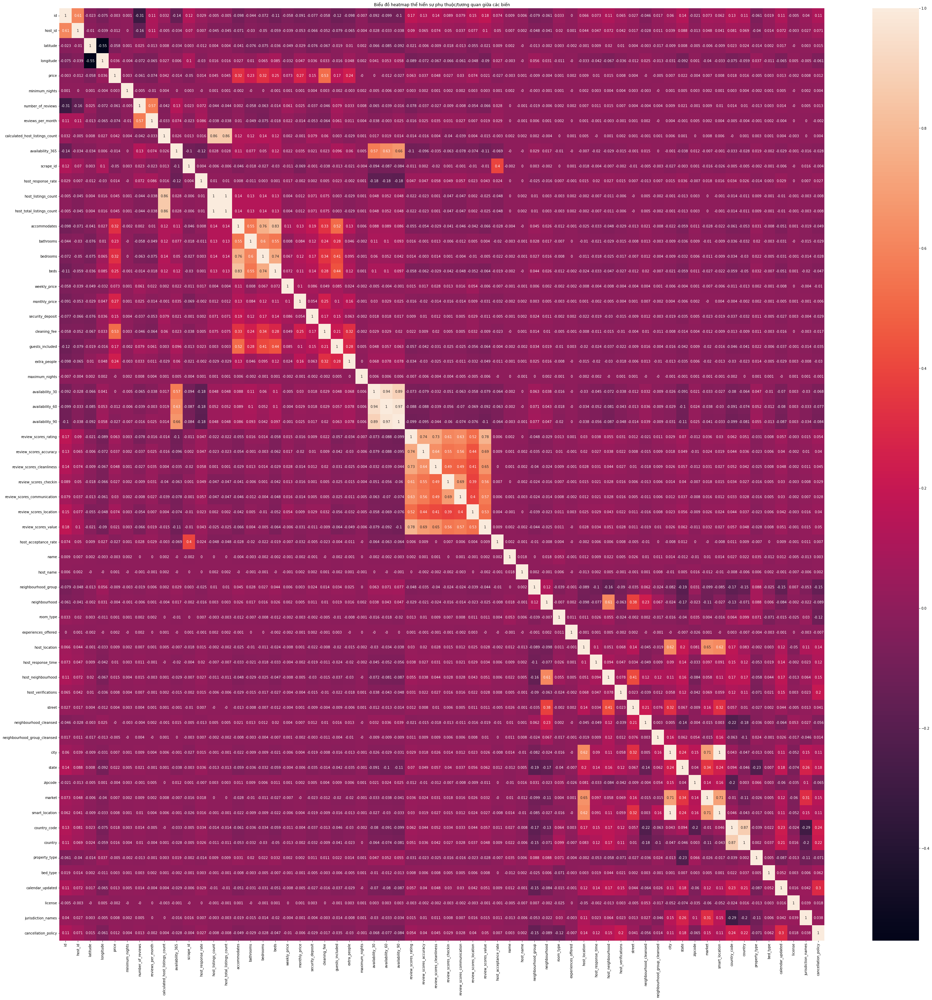

In [34]:
plt.figure(figsize = (50, 50))
sns.heatmap(correlation_df.corr().round(3), annot = True)
plt.title('Biểu đồ heatmap thể hiển sự phụ thuộc/tương quan giữa các biến')
plt.show()

Nhận xét: Quan sát biểu đồ trên, ta thấy các biến dữ liệu ít tương quan với nhau, vì đa số các biến có độ tương quan thuộc nằm trong khoảng từ -0.1 đến 0.1. Tuy nhiên, vẫn xuất hiện một số biến có độ tương quan cao như: 
- "id" và "host_id" có độ tương quan là 0.61
- "latitude" và "longitude" có độ tương quan là -0.55
- "number_of_reviews" và "reviews_per_month" có độ tương quan là 0.57
- "calculated_host_listings_count", "host_listings_count" và "host_total_listings_count" có sự tương quan với nhau.
- "availability_30", "availability_60", "availability_90" và "availability_365" có sự tương quan với nhau.
- "accommodates", "bathrooms", "bedrooms" và "beds" có sự tương quan với nhau.
- "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value" có sự tương quan với nhau.
- "host_location", "smart_location", "city" và "market" có sự tương quan với nhau.
- "country" và "country_code" có độ tương quan là 0.87
- ...


**Kết luận:** Ta có thể dùng các biến có sự tương quan với nhau để xây dựng mô hình Phân lớp và mô hình Gom cụm.

### Xử lý các giá còn thiếu theo 2 cách

Như phần tiền xử lý ở trên ta chưa thay thế missing values cho cột "price" nên ta sẽ thực hiện nó ở bước này.

Có 2 cách xử lý giá còn thiếu:
- Cách 1: Giá cao (>75%) - Thay thế missing values của cột "price" thành Q3.
- Cách 2: Giá thấp (50%-75%) - Thay thế missing values của cột "price" thành Q2.

Do đó, ta cần quan sát sự phân bố của các loại giá trên để quyết định mô hình học máy phù hợp. Ta sẽ chia thành 2 loại giá sau: giá cao (>75%) và giá thấp (<75%). Với mỗi loại giá ta sẽ tính số lượng giá trị tương ứng với loại giá có trong tập dữ liệu (**num_values**) và tỉ lệ % của chúng (**ratio_values**). Ngoài ra, ta sẽ tính thêm các giá còn thiếu và tỉ lệ của chúng. Sau đó, lưu chúng vào dataframe `statistic_price_df`.

In [35]:
def num_values(condition):
  return airbnb_df[condition]['price'].count()
def ratio_values(condition):
  return airbnb_df[condition]['price'].count() / airbnb_df.shape[0] * 100

mid_point_price = airbnb_df['price'].quantile(0.75)
high_price_condition = airbnb_df['price'] > mid_point_price
low_price_condition = airbnb_df['price'] <= mid_point_price

statistic_price_df = pd.DataFrame({ 'high_price': [num_values(high_price_condition), ratio_values(high_price_condition)],
                                    'low_price': [num_values(low_price_condition), ratio_values(low_price_condition)],
                                    'nan': [airbnb_df['price'].isna().sum(), airbnb_df['price'].isna().mean() * 100]}, index = ['num_values', 'ratio_values']).T
statistic_price_df['num_values'] = statistic_price_df['num_values'].astype(int)
statistic_price_df

,num_values,ratio_values
high_price,130761,24.124622
low_price,403339,74.413632
nan,7923,1.461746


Ta sẽ vẽ biểu đồ pieplot để thể hiện tỉ lệ giữa 2 loại giá trên:
- Màu xanh dương: giá cao
- Màu vàng: giá thấp
- Màu xanh lá cây: chưa có giá trị (missing values)

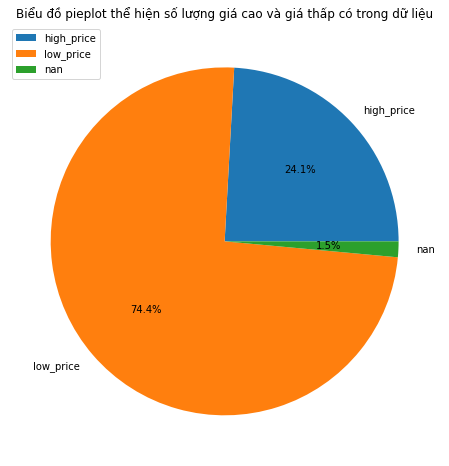

In [36]:
plt.figure(figsize = (8, 8))
plt.pie(statistic_price_df['num_values'], labels = statistic_price_df['num_values'].index, autopct = '%1.1f%%')
plt.title('Biểu đồ pieplot thể hiện số lượng giá cao và giá thấp có trong dữ liệu')
plt.legend()
plt.show()

Có thể thấy số lượng và tỉ lệ giá trị có giá thấp nhiều khoảng 3 lần số lượng giá trị có giá thấp. Trong khi số lượng missing values của cột "price" khá nhỏ (7958 mẫu tương ứng **~1.5%**) so với số lượng mẫu đã có giá trị. Do đó có thể không có sự khác biệt giữa 2 cách xử lý missing values này.

## **Cách 1:** Giá cao (>75%)

---

**Tiền xử lý dữ liệu:** Xử lý missing values

Copy vào một dataframe mới đặt tên là `airbnb_high_df`.

In [37]:
airbnb_high_df = airbnb_df.copy()

Thay thế giá trị NaN của cột "price" bằng giá trị Q3.

In [38]:
airbnb_high_df['price'] = airbnb_high_df['price'].fillna(airbnb_high_df['price'].quantile(0.75))

Xem thử thông tin của các cột dữ liệu sau khi tiền xử lý.

In [39]:
airbnb_high_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 542023 entries, 0 to 494953
Data columns (total 68 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   id                              542023 non-null  int64         
 1   name                            542023 non-null  object        
 2   host_id                         542023 non-null  int64         
 3   host_name                       542023 non-null  object        
 4   neighbourhood_group             542023 non-null  object        
 5   neighbourhood                   542023 non-null  object        
 6   latitude                        542023 non-null  float64       
 7   longitude                       542023 non-null  float64       
 8   room_type                       542023 non-null  object        
 9   price                           542023 non-null  float64       
 10  minimum_nights                  542023 non-null  int64  

Các cột đều đã có kiểu dữ liệu phù hợp và không có giá trị nào bị thiếu, đủ điều kiện để tiến hành bước tiếp theo xây dựng mô hình học máy.

---

### Có đặc trưng nào không liên quan đến dự đoán giá phòng không? Xử lý như thế nào?

Với các cột không liên quan đến việc dự đoán giá phòng, ta sẽ xóa bỏ các cột này khỏi dataframe `airbnb_high_df` vì ta chỉ cần quan tâm đến các cột có dữ liệu có thể có giá trị hơn là các cột dùng để phân biệt với nhau.

Ta sẽ bỏ đi các cột sau: "id", "name", "host_id", "host_name", "scrape_id", "last_scraped", "zipcode", "calendar_last_scraped".

In [40]:
airbnb_high_df = airbnb_high_df[airbnb_high_df.columns.drop(['id', 'name', 'host_id', 'host_name', 'scrape_id', 'last_scraped', 'zipcode', 'calendar_last_scraped'])]

---

**Tiền xử lý dữ liệu:** Chuẩn hóa dữ liệu dạng phân loại (categorical) về dạng số (numerical)

In [41]:
new_categorical_columns = [col for col in categorical_columns if col not in ['name', 'host_name', 'zipcode', 'geolocation']]
new_numerical_columns = [col for col in numerical_columns if col not in ['id', 'host_id', 'scrape_id', 'last_scraped', 'calendar_last_scraped']]

enc = OrdinalEncoder()
need_encode_values = enc.fit_transform(airbnb_high_df[new_categorical_columns])
airbnb_high_df = pd.concat([airbnb_high_df[new_numerical_columns], pd.DataFrame(need_encode_values, columns = new_categorical_columns).reindex(airbnb_high_df.index)], axis = 1)
airbnb_high_df[new_categorical_columns] = airbnb_high_df[new_categorical_columns].astype(int)

Xem thử kiểu dữ liệu của các cột dữ liệu.

In [42]:
airbnb_high_df.dtypes

latitude                                 float64
longitude                                float64
price                                    float64
minimum_nights                             int64
number_of_reviews                          int64
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
host_response_rate                         int64
host_listings_count                        int64
host_total_listings_count                  int64
accommodates                               int64
bathrooms                                float64
bedrooms                                   int64
beds                                       int64
weekly_price                             float64
monthly_price                            float64
security_deposit                         float64
cleaning_fee                             float64
guests_included                            int64
extra_people        

Các cột đều có kiểu dữ liệu phù hợp.

---

Tiếp theo, ta sẽ vẽ biểu đồ boxplot cho từng cột dữ liệu để xem thử dữ liệu có xuất hiện outlier không.

Với biểu đồ boxplot, ta sẽ vẽ từng biểu đồ con cho từng cột dữ liệu có trong dữ liệu. Với mỗi biểu đồ con thể hiện các thông tin thống kê mô tả tương ứng với cột dữ liệu đó.
- Các cận bên trái và bên phải tương ứng với giá trị nhỏ nhất (min) và giá trị lớn nhất (max) của dữ liệu.
- Các cạnh bên trái và bên phải của hình hộp tương ứng với khoảng tứ phân vị thứ nhất (Q1) và khoảng tứ phân vị thứ 3 (Q3).
- Đường ở giữa hình hộp tương ứng với giá trị trung bình (mean).
- Các chấm còn lại nằm ở bên ngoài cận bên trái và cận bên phải là các outlier xuất hiện trong tập dữ liệu.

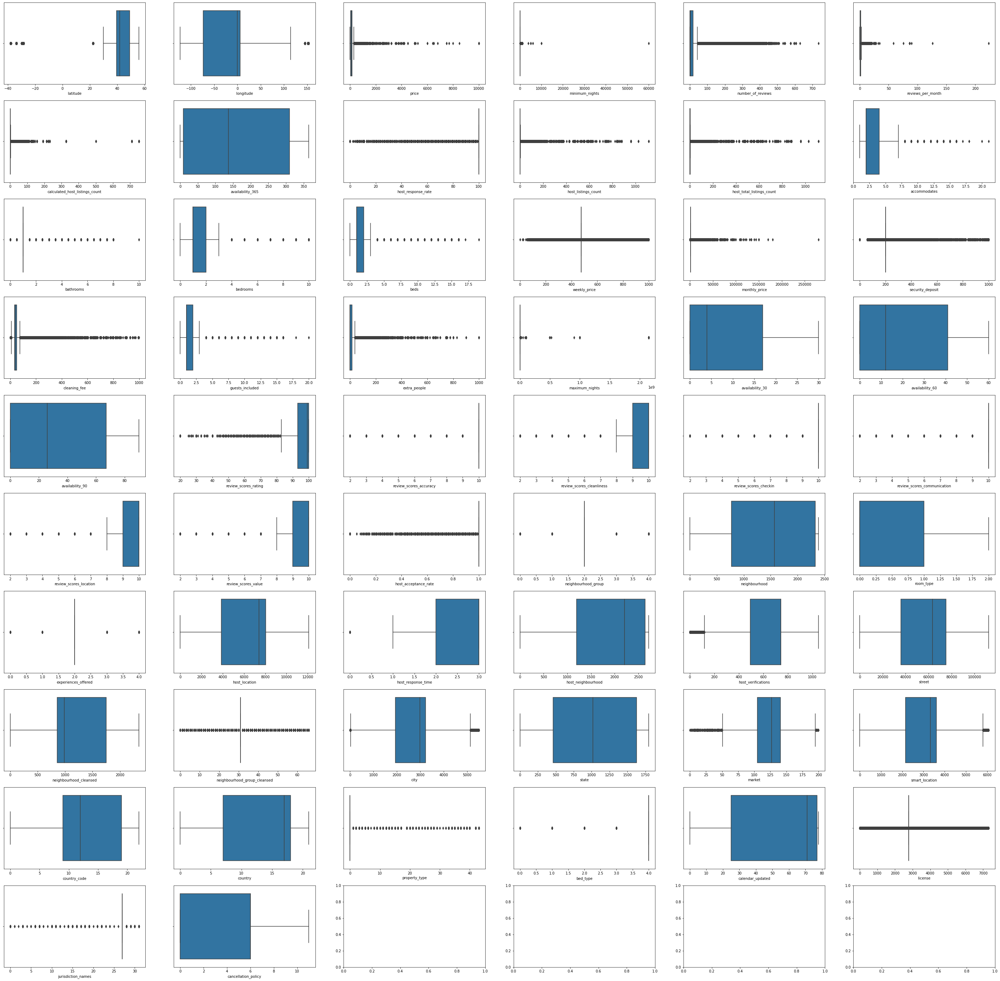

In [43]:
fig, ax = plt.subplots(10, 6, figsize = (50, 50))

i = 1
for col in airbnb_high_df.columns:
  if col in ['first_review', 'host_since', 'last_review']:
    continue
  
  plt.subplot(10, 6, i)
  sns.boxplot(x = airbnb_high_df[col])
  i += 1

plt.show()

Nhận xét: Quan sát các biểu đồ boxplot, ta thấy được:
- Các cột không bị ảnh hưởng bởi outlier: "availability_365", "availability_30", "availability_60", "availability_90", "neighbourhood", "room_type", "host_location", "host_neighbourhood", "street", "neighbourhood_cleansed", "state", "country_code", "country", "calendar_updated", "cancellation_policy" -> giữ nguyên.
- Các cột có xuất hiện outlier nhưng với số lượng ít nên sẽ không ảnh hưởng nhiều đến việc xây dựng mô hình: "latitude", "longitude", "host_response_time", "host_vertifications", "city", "market", "smart_location" -> giữ nguyên.
- Có một số cột sau khi xử lý missing values có xuất hiện outlier: "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value", "neighbourhood_group", "experiences_offered", "neighbourhood_group_cleansed", "property_type", "bed_type", "jorisdiction_names" -> giữ nguyên.
- Có một số cột có outlier nhưng không ảnh hưởng tới dữ liệu: "minimum_nights", "reviews_per_month", "accommodates", "bathrooms", "bedrooms", "beds", "maximum_nights" -> giữ nguyên.
- Các cột còn lại có xuất hiện nhiều outlier: "price", "number_of_reviews", "calculated_host_listings_count", "host_response_rate", "host_listings_count", "host_total_listings_count", "weekly_price", "monthly_price", "security_deposit", "cleaning_fee", "license" -> xử lý outlier.

Các cột có xuất hiện outlier sẽ được tiền xử lý ở các bước sau.

### Các đặc trưng nào ảnh hưởng/hữu ích đến dự đoán giá phòng? (correlation)

Ta sẽ vẽ biểu đồ scatterplot để thể hiện sự tương quan giữa cột "price" và các cột còn lại có trong dữ liệu. Với mỗi biểu đồ con sẽ có:
- Trục tung: các giá trị tương ứng có trong cột "price".
- Trục hoành: các giá trị tương ứng có trong cột dữ liệu.

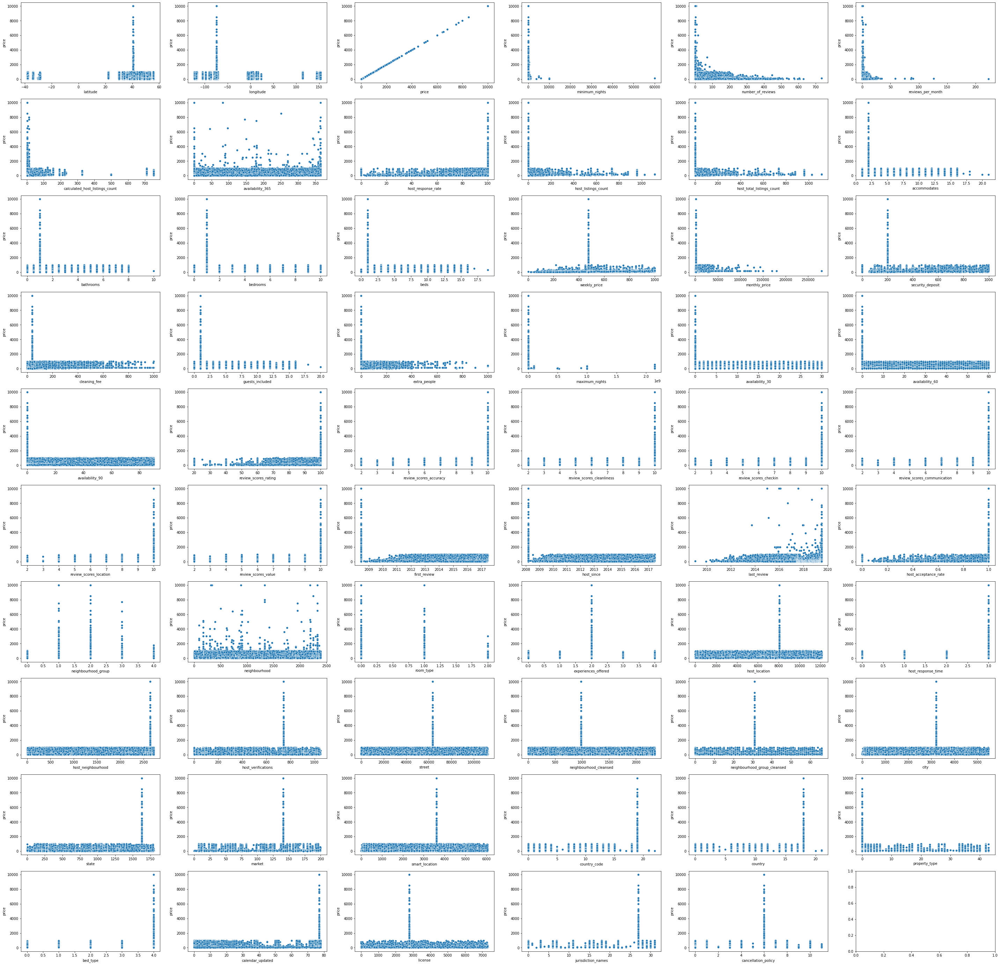

In [53]:
fig, ax = plt.subplots(10, 6, figsize = (50, 50))

i = 1
for col in airbnb_high_df.columns:
  plt.subplot(10, 6, i)
  sns.scatterplot(data = airbnb_high_df, x = col, y = 'price')
  i += 1

plt.show()

Nhận xét: Quan sát các biểu đồ scatterplot trên, ta nhận thấy: 
- Các thuộc tính không có quan hệ nhiều với "price" về dạng Linear.
- Các thuộc tính ảnh hưởng đến thuộc tính "price" dạng K-means.

Sau đó, ta sẽ sử dụng phương pháp Stepwise: Forward/Backward để chọn ra những đặc trưng phù hợp nhất sẽ sử dụng trong mô hình hồi quy.

In [54]:
def stepwise_selection(X, y, initial_list = [], threshold_in = 0.05, threshold_out = 0.05, verbose = True):
  included = list(initial_list)
  while True:
    changed = False

    # forward step
    excluded = list(set(X.columns) - set(included))
    new_pval = pd.Series(index = excluded)
    for new_column in excluded:
      model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included + [new_column]]))).fit()
      new_pval[new_column] = model.pvalues[new_column]
    best_pval = new_pval.min()
    if best_pval < threshold_in:
      best_feature = new_pval.idxmin()
      included.append(best_feature)
      changed = True
      if verbose:
        print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))
    
    # backward step
    model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
    # use all coefs except intercept
    pvalues = model.pvalues.iloc[:1]
    worst_pval = pvalues.max() # null if pvalues is empty
    if worst_pval > threshold_out:
      changed = True
      worst_feature = pvalues.idxmax()
      included.remove(worst_feature)
      if verbose:
        print('Drop  {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
    if not changed:
      break
  return included

X = airbnb_high_df[airbnb_high_df.columns.drop(['price', 'first_review', 'host_since', 'last_review'])]
y = airbnb_high_df['price']
result = stepwise_selection(X, y)

Add  beds                           with p-value 0.0
Add  extra_people                   with p-value 0.0
Add  accommodates                   with p-value 0.0
Add  review_scores_accuracy         with p-value 0.0
Add  review_scores_location         with p-value 0.0
Add  security_deposit               with p-value 0.0
Add  monthly_price                  with p-value 0.0
Add  reviews_per_month              with p-value 0.0
Add  bathrooms                      with p-value 0.0
Add  bedrooms                       with p-value 0.0
Add  cleaning_fee                   with p-value 0.0
Add  availability_90                with p-value 0.0
Add  availability_60                with p-value 1.73488e-203
Add  guests_included                with p-value 2.94112e-167
Add  state                          with p-value 1.66852e-143
Add  weekly_price                   with p-value 2.78653e-104
Add  country                        with p-value 1.0376e-96
Add  review_scores_rating           with p-value 3.96786

Theo phương pháp trên cho ta các cột sau có ảnh hưởng lớn đến việc xây dựng mô hình.

In [55]:
airbnb_high_df = airbnb_high_df[['price', 'first_review', 'host_since', 'last_review'] + result]

### Mô hình nào phù hợp để thực hiện yêu cầu dự đoán giá phòng (hồi qui, phân lớp, gom cụm)? Giải thích.

Do vậy, ta sẽ lần lượt thử nghiệm với từng loại mô hình đã học để tìm ra mô hình nào phù hợp nhất để dự đoán giá phòng:
- Hồi quy (ARIMA)
  - Đặt vấn đề: Dự đoán giá phòng dựa vào ngày cuối cùng review phòng.
  - Các thuộc tính sử dụng: "last_review", "price".
- Gom cụm (K-means)
  - Đặt vấn đề: Gom cụm các thuộc tính về việc review phòng để xác định loại giá phòng.
  - Các thuộc tính sử dụng: "review_scores_location", "reviews_per_month", "review_scores_rating", "review_scores_value", "number_of_reviews", "review_scores_cleanliness", "review_scores_checkin".
- Phân lớp (Decision Tree)
  - Đặt vấn đề: Dự đoán giá phòng dựa theo các đặc điểm của phòng với nhãn là loại giá phòng đã được gom cụm trước đó.
  - Các thuộc tính sử dụng: "accommodates", "bathrooms", "bedrooms", "beds", "cluster".

Sau đó sẽ so sánh đánh giá 2 mô hình Hồi quy (ARIMA) và Phân lớp (Decision Tree) để xem mô hình nào sẽ cho kết quả tốt hơn.

### Xây dựng mô hình dự đoán với giải pháp lựa chọn, và nêu phương pháp lựa chọn và đánh giá mô hình đã chọn?

#### 1. Mô hình hồi quy (ARIMA)

---

**Tiền xử lý dữ liệu:** Xử lý dữ liệu chuỗi thời gian

Trước tiên, ta sẽ loại bỏ một số cột không cần thiết và chỉ giữ lại 2 cột quan trọng cho mô hình là: "last_review" và "price" và lưu vào dataframe `airbnb_arima_df`.

In [56]:
airbnb_arima_df = airbnb_high_df[['last_review', 'price']]

Để tăng tính liên tục của thời gian, ta sẽ bổ sung các ngày còn thiếu với giá tiền mặc định là 0.

In [57]:
date_idx = pd.date_range(airbnb_arima_df['last_review'].min(), airbnb_arima_df['last_review'].max())
not_in_date_idx = date_idx[~date_idx.isin(airbnb_arima_df.index)]
airbnb_arima_df = airbnb_arima_df.append(pd.DataFrame({ 'last_review': not_in_date_idx, 'price': np.full(not_in_date_idx.size, 0)}))

Sau đó, gom nhóm các dòng có cùng tháng và năm và tính số tiền trung bình của từng tháng đó.

In [58]:
airbnb_arima_df = airbnb_arima_df.groupby(pd.Grouper(key = 'last_review', freq = 'MS')).mean()

Xem thử tập dữ liệu sau khi đã tiền xử lý.

In [59]:
airbnb_arima_df.head()

,price
last_review,
2009-01-01,7.333333
2009-02-01,0.000000
2009-03-01,0.000000
2009-04-01,0.000000
2009-05-01,0.000000


---

Trước tiên, ta cần xem xét chuỗi thời gian xem nó có tính dừng hay không. Bước này có thể được thực hiện bằng cách tính hàm tự tương quan (ACF) và hàm tự tương quan riêng phần (PACF). Ta sẽ trực quan hóa bằng các biểu đồ tương quan gắn với ACF và PACF.

Nếu chuỗi thời gian không có tính dừng, lấy sai phân của nó 1 hay nhiều lần để làm cho
nó có tính dừng.


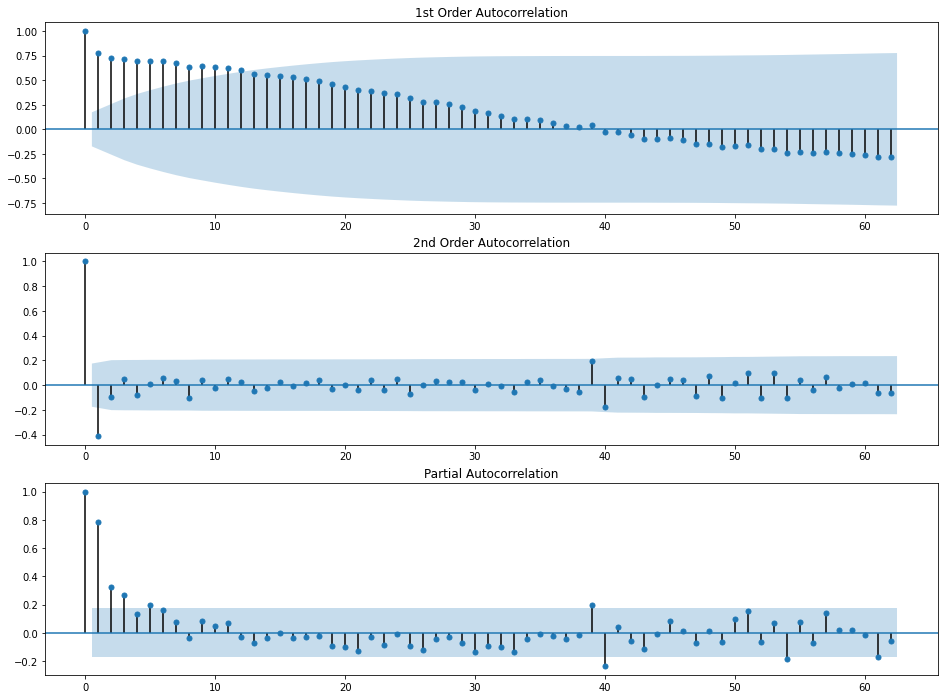

In [60]:
fig, ax = plt.subplots(3, 1, figsize = (16, 12))
fig = plot_acf(airbnb_arima_df['price'], lags = 62, ax = ax[0], title = '1st Order Autocorrelation')
fig = plot_acf(airbnb_arima_df['price'].diff().dropna(), lags = 62, ax = ax[1], title = '2nd Order Autocorrelation')
fig = plot_pacf(airbnb_arima_df['price'].dropna(), lags = 62, ax = ax[2])
plt.show()

Nhận xét: Quan sát từ 2 biểu đồ trên (ACF và PACF), lần đầu tiên của biểu đồ ACF chưa thấy xuất hiện tính dừng vì biểu đồ thay đổi giá trị liên tục từ cao xuống thấp. Do đó ta lấy đạo hàm 1 lần cho biểu đồ ACF để thấy được tính dừng. Tương tự với biểu đồ PACF ta thấy được tính dừng của chuỗi thời gian lần đầu tiên.

Từ đó có thể lựa chọn được các tham số của mô hình ARIMA(p, d, q) như sau:
- p = 2 là bậc của đồ thị AR. Xét từ độ trễ đầu tiên, thanh nào nằm ngoài đường giới hạn và sau độ giảm một cách đáng kể sau một độ trễ.
- d = 1 là bậc sai phân, trong trường hợp này sai phân cách nhau 1 tháng.
- q = 1 là bậc của đồ thị MA. Xét từ độ trễ đầu tiên, thanh nào nằm ngoài đường giới hạn và sau độ tăng một cách đáng kể sau một độ trễ.

Thực hiện xây dựng mô hình ARIMA và in ra tóm tắt kết quả chạy mô hình bằng các thông số mô tả.

In [61]:
# Chia thành 2 tập train và test với tỉ lệ 70/30
split_point = int(airbnb_arima_df.shape[0] * 0.7)
X = airbnb_arima_df[:split_point]
y = airbnb_arima_df[split_point:]

# Xây dựng mô hình ARIMA
model = ARIMA(X, order = (2, 1, 1))
model_fit = model.fit()

# Tóm tắt kết quả mô hình
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.price   No. Observations:                   87
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -383.022
Method:                       css-mle   S.D. of innovations             19.668
Date:                Fri, 06 Jan 2023   AIC                            776.044
Time:                        07:32:55   BIC                            788.374
Sample:                    02-01-2009   HQIC                           781.009
                         - 04-01-2016                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.6686      0.616      2.708      0.007       0.461       2.876
ar.L1.D.price    -0.1250      0.165     -0.756      0.449      -0.449       0.199
ar.L2.D.price     0.0078      0.141     

Dự đoán kết quả chạy mô hình trên tập test với 95% tin cậy.

In [62]:
# Dự đoán trên tập test với 95% tin cậy
fc, se, conf = model_fit.forecast(airbnb_arima_df.shape[0] - split_point, alpha = 0.05)

Sau đó, để so sánh giữa kết quả dự đoán từ mô hình với kết quả thực tế trên tập test, ta sẽ vẽ biểu đồ đường thể hiện kết quả dự đoán giá phòng ("price") dựa vào "last_review". Trong đó:
- Trục tung: giá phòng
- Trục hoành: ngày review cuối cùng

Các đường màu thể hiện các ý nghĩa khác nhau:
- Màu xanh dương: giá phòng của tập train.
- Màu cam: giá phòng của tập test.
- Màu xanh lá: giá phòng được dự đoán từ mô hình.

Khoảng màu xám thể hiện cận trên và cận dưới giao động trong việc dự đoán mô hình.

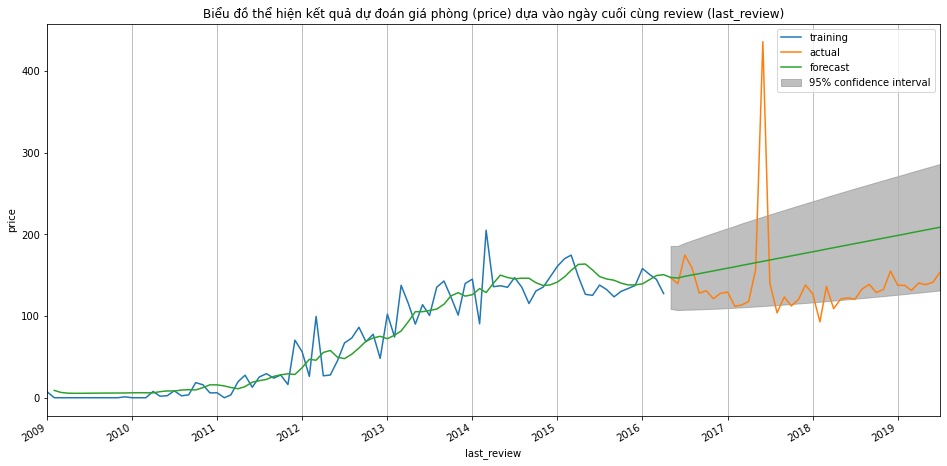

In [63]:
# Tạo Series cho biểu đồ
fc_series = pd.Series(fc, index = y.index)
lower_series = pd.Series(conf[:, 0], index = y.index)
upper_series = pd.Series(conf[:, 1], index = y.index)

# Vẽ biểu đồ trực quan hóa
fig, ax = plt.subplots(figsize = (16, 8))
plt.plot(X, label = 'training')
plt.plot(y, label = 'actual')
fig = model_fit.plot_predict(end = y.index[y.size - 1], dynamic = False, plot_insample = False, ax = ax)
plt.xlim(airbnb_arima_df.index.min(), airbnb_arima_df.index.max())
plt.title('Biểu đồ thể hiện kết quả dự đoán giá phòng (price) dựa vào ngày cuối cùng review (last_review)')
plt.xlabel('last_review')
plt.ylabel('price')
plt.legend()
plt.grid(axis = 'x')
plt.show()

Nhận xét: Quan sát biểu đồ đường ta thấy kết quả dự đoán giá phòng (forecast) có sự tương đồng so với tập dữ liệu thực tế (actual) trong 60 ngày cuối. Ngoài ra còn nhận thấy sự tăng dần của giá phòng theo từng năm chứng tỏ sự tương quan giữa "price" và "last_review" càng cao thì giá phòng càng tăng theo.

Ta sẽ đánh giá mô hình ARIMA dựa vào các độ đo 'Good-Of-Fit' cho mô hình như: ME, MAE, MPE, MAPE, MSE, RMSE, R2, ACF1.

In [64]:
def mean_error(y_test, y_pred):
  return np.mean(y_pred - y_test)
def mean_percentage_error(y_test, y_pred):
  return np.mean((y_pred - y_test) / y_test)
def root_mean_squared_error(y_test, y_pred):
  return sqrt(mean_squared_error(y_test, y_pred))
y_test = airbnb_arima_df[split_point:]['price'].values
y_pred = fc_series.values

# The mean error
print('Mean error (ME):                           %.4f' % mean_error(y_test, y_pred))
# The mean absolute error
print('Mean absolute error (MAE):                 %.4f' % mean_absolute_error(y_test, y_pred))
# The mean percentage error
print('Mean percentage error (MPE):               %.4f' % mean_percentage_error(y_test, y_pred))
# The mean absolute percentage error
print('Mean absolute percentage error (MAPE):     %.4f' % mean_absolute_percentage_error(y_test, y_pred))
# The mean squared error
print('Mean squared error (MSE):                  %.4f' % mean_squared_error(y_test, y_pred))
# The root mean squared error
print('Root mean squared error (RMSE):            %.4f' % root_mean_squared_error(y_test, y_pred))
# The R squared
print('R-Square (R2):                             %.4f' % r2_score(y_test, y_pred))
# The autocorrelation of errors at lag 1
print('Autocorrelation of errors at lag 1 (ACF1): %.4f' % acf(fc - y_test)[1])

Mean error (ME):                           37.8020
Mean absolute error (MAE):                 53.3565
Mean percentage error (MPE):               0.3437
Mean absolute percentage error (MAPE):     0.3857
Mean squared error (MSE):                  4490.1922
Root mean squared error (RMSE):            67.0089
R-Square (R2):                             -0.7510
Autocorrelation of errors at lag 1 (ACF1): 0.2508


Ta sẽ đánh giá mô hình dựa vào độ đo R squared.

In [65]:
# Accuracy
accuracy_arima_high = r2_score(y_test, y_pred)
print(f'Mô hình dự đoán với độ chính xác là: {accuracy_arima_high}')

Mô hình dự đoán với độ chính xác là: -0.751007522576568


#### 2. Mô hình gom cụm (K-means)

---

**Tiền xử lý dữ liệu:** Chuẩn hóa dữ liệu

Trước tiên, ta sẽ loại bỏ một số cột không cần thiết và chỉ giữ lại các cột quan trọng cho mô hình là: "review_scores_location", "reviews_per_month", "review_scores_rating", "review_scores_value", "number_of_reviews", "review_scores_cleanliness", "review_scores_checkin" và lưu vào dataframe `airbnb_kmeans_df`.

In [66]:
airbnb_kmeans_df = airbnb_high_df[['review_scores_location', 'reviews_per_month', 'review_scores_rating', 'review_scores_value', 'number_of_reviews', 'review_scores_cleanliness', 'review_scores_checkin']]

Sau đó, ta sẽ chuẩn hóa dữ liệu theo kiểu min-max để ước tính chia tỉ lệ của từng cột riêng lẻ sao cho nó nằm trong khoảng từ 0 đến 1.

In [67]:
scaler = MinMaxScaler()
new_airbnb_kmeans_data = scaler.fit_transform(airbnb_kmeans_df)
airbnb_kmeans_df = pd.DataFrame(new_airbnb_kmeans_data, columns = airbnb_kmeans_df.columns)

Xem thử tập dữ liệu sau khi đã tiền xử lý.

In [68]:
airbnb_kmeans_df.head()

,review_scores_location,reviews_per_month,review_scores_rating,review_scores_value,number_of_reviews,review_scores_cleanliness,review_scores_checkin
0,1.0,0.000897,1.0,1.0,0.012245,1.0,1.0
1,1.0,0.001659,1.0,1.0,0.061224,1.0,1.0
2,1.0,0.003857,1.0,1.0,0.000000,1.0,1.0
3,1.0,0.020763,1.0,1.0,0.367347,1.0,1.0
4,1.0,0.000404,1.0,1.0,0.012245,1.0,1.0


---

Đầu tiên, ta sử dụng phương pháp Elbow để tìm k (số cluster) phù hợp nhất để xây dựng mô hình.

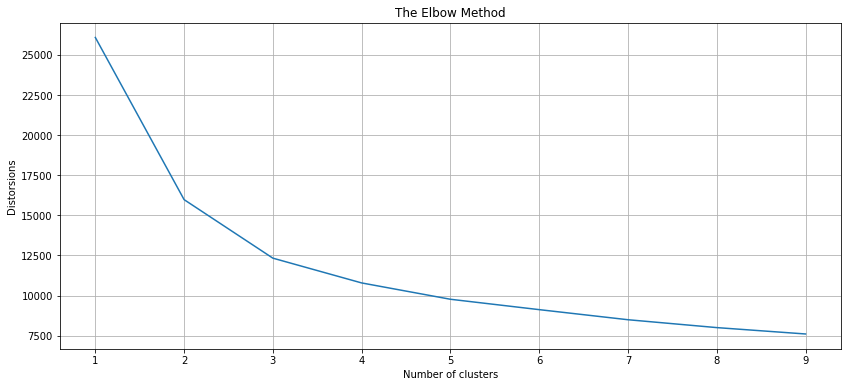

In [69]:
distorsions = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(airbnb_kmeans_df)
    distorsions.append(kmeans.inertia_)
plt.figure(figsize = (14, 6))
plt.plot(range(1, 10), distorsions)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Distorsions')
plt.grid()
plt.show()

Nhận xét: Theo biểu đồ trên, chúng ta có thể thấy một đường gấp khúc tại **k = 2**. Do đó **k = 2** có thể được xem là 1 giá trị tốt của mô hình K-means để gom cụm dữ liệu.

Thực hiện xây dựng mô hình K-means và tìm các điểm trung tâm gom cụm.

In [70]:
# Chia thành 2 tập train và test với tỉ lệ 70/30
X = airbnb_kmeans_df.copy()

# Xây dựng mô hình K-means
model = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
model_fit = model.fit(X)

# Gán cụm cho tập dữ liệu
airbnb_kmeans_df['cluster'] = model.labels_

# Tìm các điểm trung tâm gom cụm
print('Cluster centers:')
print(model.cluster_centers_)

Cluster centers:
[[0.86358184 0.00574826 0.7977057  0.80648612 0.0297146  0.78177559
  0.89115519]
 [0.97687185 0.0059249  0.97324951 0.97475506 0.02217828 0.98093075
  0.99341476]]


Để dễ trực quan hơn, ta sẽ vẽ biểu đồ scatterplot để thể hiện các gom cụm của dữ liệu. Trong đó:
- Trục tung: component 1
- Trục hoành: component 2

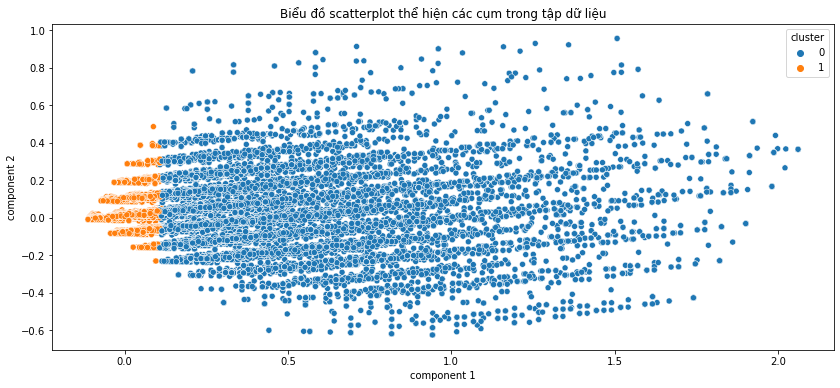

In [71]:
# Giảm chiều dữ liệu
pca = PCA(n_components = 2)
pca_df = pd.DataFrame(pca.fit_transform(airbnb_kmeans_df[airbnb_kmeans_df.columns.drop(['cluster'])]), columns = ['component 1', 'component 2'])
pca_df['cluster'] = airbnb_kmeans_df['cluster']

# Vẽ biểu đồ trực quan hóa
plt.figure(figsize = (14, 6))
sns.scatterplot(data = pca_df, x = 'component 1', y = 'component 2', hue = 'cluster').set_title('Biểu đồ scatterplot thể hiện các cụm trong tập dữ liệu')
plt.show()

Nhận xét: Quan sát biểu đồ trên, ta có thể thấy các cụm dữ liệu được chia thành 2 cụm riêng biệt:
- Cụm 0 (màu xanh): Nằm ở phía bên phải, chiếm 1/4 số lượng mẫu -> Thể hiện cho các phòng thuộc giá thấp.
- Cụm 1 (Màu cam): Nằm ở phía bên trái, chiếm 3/4 số lượng mẫu -> Thể hiện cho các phòng thuộc giá cao.

#### 3. Mô hình phân lớp (Decision Tree)

---

**Tiền xử lý dữ liệu:** Loại bỏ các cột không cần thiết

Trước tiên, ta sẽ loại bỏ một số cột không cần thiết và chỉ giữ lại các cột quan trọng cho mô hình là: "room_type", "accommodates", "bathrooms", "bedrooms", "beds", "cluster" và lưu vào dataframe `airbnb_decision_tree_df`.

In [72]:
airbnb_decision_tree_df = airbnb_high_df[['accommodates', 'bathrooms', 'bedrooms', 'beds']]
airbnb_decision_tree_df['cluster'] = airbnb_kmeans_df['cluster']

Xem thử tập dữ liệu sau khi đã tiền xử lý.

In [73]:
airbnb_decision_tree_df.head()

,accommodates,bathrooms,bedrooms,beds,cluster
0,2,1.0,1,1,1
1,2,1.0,1,1,1
2,2,1.0,1,1,1
3,2,1.0,1,1,1
4,2,1.0,1,1,1


---

Thực hiện xây dựng mô hình Decision Tree.

In [74]:
# Chia thành 2 tập train và test với tỉ lệ 70/30
feature_cols = airbnb_decision_tree_df.columns.drop(['cluster'])
X = airbnb_decision_tree_df[feature_cols]
y = airbnb_decision_tree_df['cluster']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)

# Xây dựng mô hình Decision Tree
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

Dự đoán kết quả chạy mô hình trên tập test.

In [75]:
# Dự đoán dữ liệu trên tập test
y_pred = clf.predict(X_test)

Ta sẽ trực quan hóa mô hình bằng cây quyết định để thấy được các nhánh cũng như sự phân lớp của cây.

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.189256 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.189256 to fit



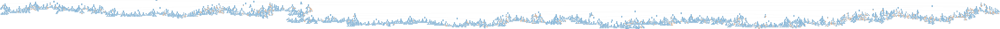

In [76]:
# Vẽ biểu đồ trực quan hóa
dot_data = StringIO()
export_graphviz(clf, out_file = dot_data, filled = True, rounded = True, special_characters = True, feature_names = feature_cols, class_names = ['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('decision_tree.png')
Image(graph.create_png())

Ta sẽ đánh giá mô hình Decision Tree dựa vào các độ đo cho mô hình như: Confusion Matrix, Accuracy, Precision, Recall, F-score

Accuracy:    0.8293
Precision:   0.8311
Recall:      0.9972
F-score:     0.9066
R-Square:    -0.2160
Confusion Matrix:


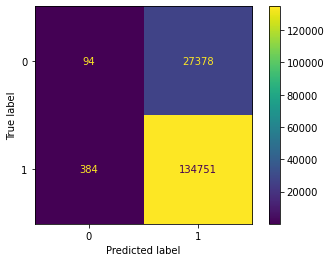

In [77]:
def plot_confusion_matrix(y_test, y_pred):
  disp = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, y_pred))
  disp.plot()
  plt.show()

# Accuracy
print('Accuracy:    %.4f' % accuracy_score(y_test, y_pred))
# Precision
print('Precision:   %.4f' % precision_score(y_test, y_pred))
# Recall
print('Recall:      %.4f' % recall_score(y_test, y_pred))
# F-score
print('F-score:     %.4f' % f1_score(y_test, y_pred))
# R squared
print('R-Square:    %.4f' % r2_score(y_test, y_pred))
# Confusion matrix
print('Confusion Matrix:')
plot_confusion_matrix(y_test, y_pred)

Ta sẽ đánh giá mô hình dựa vào độ đo R squared.

In [78]:
# Accuracy
accuracy_decision_tree_high = r2_score(y_test, y_pred)
print(f'Mô hình dự đoán với độ chính xác là: {accuracy_decision_tree_high}')

Mô hình dự đoán với độ chính xác là: -0.2159952081180967


## **Cách 2:** Giá thấp (50%-75%)

---

**Tiền xử lý dữ liệu:** Xử lý missing values

Copy vào một dataframe mới đặt tên là `airbnb_low_df`.

In [79]:
airbnb_low_df = airbnb_df.copy()

Thay thế giá trị NaN của cột "price" bằng giá trị Q2.

In [80]:
airbnb_low_df['price'] = airbnb_low_df['price'].fillna(airbnb_low_df['price'].quantile(0.5))

Xem thử thông tin của các cột dữ liệu sau khi tiền xử lý.

In [81]:
airbnb_low_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 542023 entries, 0 to 494953
Data columns (total 68 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   id                              542023 non-null  int64         
 1   name                            542023 non-null  object        
 2   host_id                         542023 non-null  int64         
 3   host_name                       542023 non-null  object        
 4   neighbourhood_group             542023 non-null  object        
 5   neighbourhood                   542023 non-null  object        
 6   latitude                        542023 non-null  float64       
 7   longitude                       542023 non-null  float64       
 8   room_type                       542023 non-null  object        
 9   price                           542023 non-null  float64       
 10  minimum_nights                  542023 non-null  int64  

Các cột đều đã có kiểu dữ liệu phù hợp và không có giá trị nào bị thiếu, đủ điều kiện để tiến hành bước tiếp theo xây dựng mô hình học máy.

---

### Có đặc trưng nào không liên quan đến dự đoán giá phòng không? Xử lý như thế nào?

Với các cột không liên quan đến việc dự đoán giá phòng, ta sẽ xóa bỏ các cột này khỏi dataframe `airbnb_low_df` vì ta chỉ cần quan tâm đến các cột có dữ liệu có thể có giá trị hơn là các cột dùng để phân biệt với nhau.

Ta sẽ bỏ đi các cột sau: "id", "name", "host_id", "host_name", "scrape_id", "last_scraped", "zipcode", "calendar_last_scraped".

In [82]:
airbnb_low_df = airbnb_low_df[airbnb_low_df.columns.drop(['id', 'name', 'host_id', 'host_name', 'scrape_id', 'last_scraped', 'zipcode', 'calendar_last_scraped'])]

---

**Tiền xử lý dữ liệu:** Chuẩn hóa dữ liệu dạng phân loại (categorical) về dạng số (numerical)

In [83]:
new_categorical_columns = [col for col in categorical_columns if col not in ['name', 'host_name', 'zipcode', 'geolocation']]
new_numerical_columns = [col for col in numerical_columns if col not in ['id', 'host_id', 'scrape_id', 'last_scraped', 'calendar_last_scraped']]

enc = OrdinalEncoder()
need_encode_values = enc.fit_transform(airbnb_low_df[new_categorical_columns])
airbnb_low_df = pd.concat([airbnb_low_df[new_numerical_columns], pd.DataFrame(need_encode_values, columns = new_categorical_columns).reindex(airbnb_low_df.index)], axis = 1)
airbnb_low_df[new_categorical_columns] = airbnb_low_df[new_categorical_columns].astype(int)

Xem thử kiểu dữ liệu của các cột dữ liệu.

In [84]:
airbnb_low_df.dtypes

latitude                                 float64
longitude                                float64
price                                    float64
minimum_nights                             int64
number_of_reviews                          int64
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
host_response_rate                         int64
host_listings_count                        int64
host_total_listings_count                  int64
accommodates                               int64
bathrooms                                float64
bedrooms                                   int64
beds                                       int64
weekly_price                             float64
monthly_price                            float64
security_deposit                         float64
cleaning_fee                             float64
guests_included                            int64
extra_people        

Các cột đều có kiểu dữ liệu phù hợp.

---

Tiếp theo, ta sẽ vẽ biểu đồ boxplot cho từng cột dữ liệu để xem thử dữ liệu có xuất hiện outlier không.

Với biểu đồ boxplot, ta sẽ vẽ từng biểu đồ con cho từng cột dữ liệu có trong dữ liệu. Với mỗi biểu đồ con thể hiện các thông tin thống kê mô tả tương ứng với cột dữ liệu đó.
- Các cận bên trái và bên phải tương ứng với giá trị nhỏ nhất (min) và giá trị lớn nhất (max) của dữ liệu.
- Các cạnh bên trái và bên phải của hình hộp tương ứng với khoảng tứ phân vị thứ nhất (Q1) và khoảng tứ phân vị thứ 3 (Q3).
- Đường ở giữa hình hộp tương ứng với giá trị trung bình (mean).
- Các chấm còn lại nằm ở bên ngoài cận bên trái và cận bên phải là các outlier xuất hiện trong tập dữ liệu.

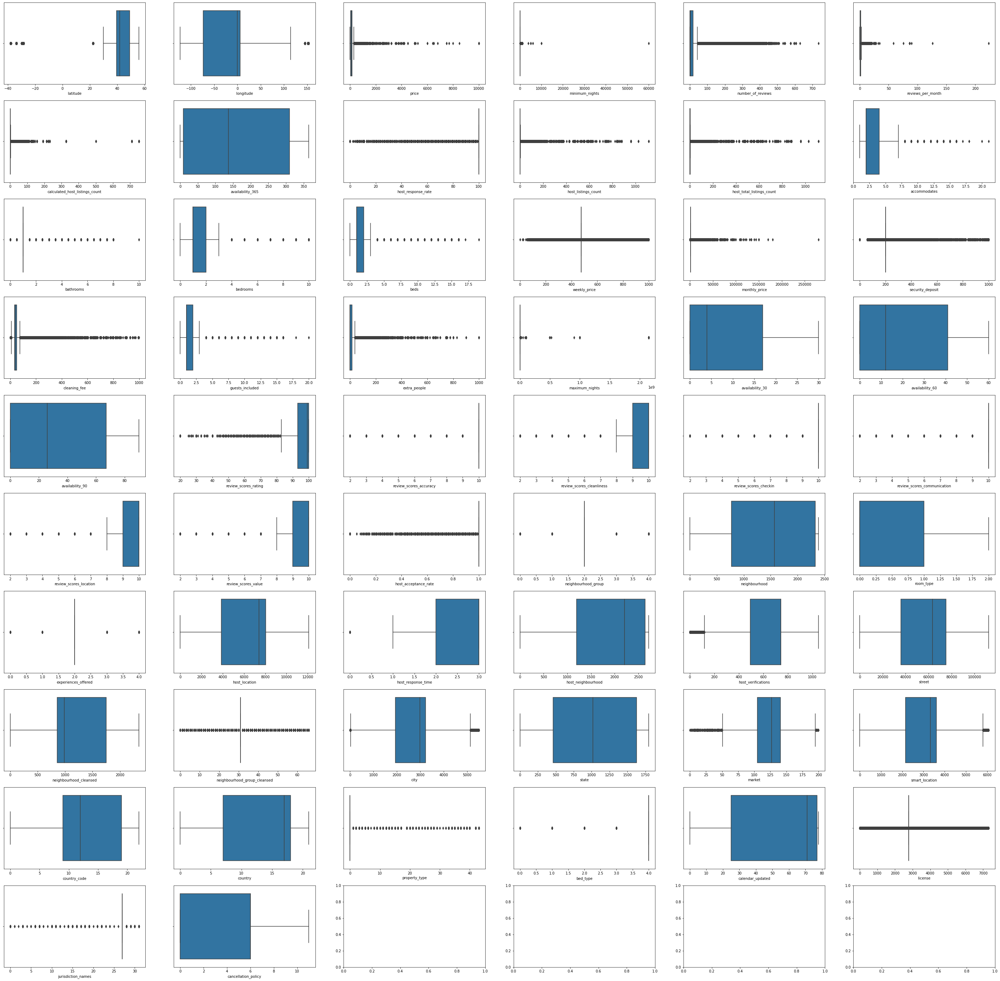

In [85]:
fig, ax = plt.subplots(10, 6, figsize = (50, 50))

i = 1
for col in airbnb_low_df.columns:
  if col in ['first_review', 'host_since', 'last_review']:
    continue
  
  plt.subplot(10, 6, i)
  sns.boxplot(x = airbnb_low_df[col])
  i += 1

plt.show()

Nhận xét: Quan sát các biểu đồ boxplot, ta thấy được:
- Các cột không bị ảnh hưởng bởi outlier: "availability_365", "availability_30", "availability_60", "availability_90", "neighbourhood", "room_type", "host_location", "host_neighbourhood", "street", "neighbourhood_cleansed", "state", "country_code", "country", "calendar_updated", "cancellation_policy" -> giữ nguyên.
- Các cột có xuất hiện outlier nhưng với số lượng ít nên sẽ không ảnh hưởng nhiều đến việc xây dựng mô hình: "latitude", "longitude", "host_response_time", "host_vertifications", "city", "market", "smart_location" -> giữ nguyên.
- Có một số cột sau khi xử lý missing values có xuất hiện outlier: "review_scores_rating", "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", "review_scores_location", "review_scores_value", "neighbourhood_group", "experiences_offered", "neighbourhood_group_cleansed", "property_type", "bed_type", "jorisdiction_names" -> giữ nguyên.
- Có một số cột có outlier nhưng không ảnh hưởng tới dữ liệu: "minimum_nights", "reviews_per_month", "accommodates", "bathrooms", "bedrooms", "beds", "maximum_nights" -> giữ nguyên.
- Các cột còn lại có xuất hiện nhiều outlier: "price", "number_of_reviews", "calculated_host_listings_count", "host_response_rate", "host_listings_count", "host_total_listings_count", "weekly_price", "monthly_price", "security_deposit", "cleaning_fee", "license" -> xử lý outlier.

### Các đặc trưng nào ảnh hưởng/hữu ích đến dự đoán giá phòng? (correlation)

Ta sẽ vẽ biểu đồ scatterplot để thể hiện sự tương quan giữa cột "price" và các cột còn lại có trong dữ liệu. Với mỗi biểu đồ con sẽ có:
- Trục tung: các giá trị tương ứng có trong cột "price".
- Trục hoành: các giá trị tương ứng có trong cột dữ liệu.

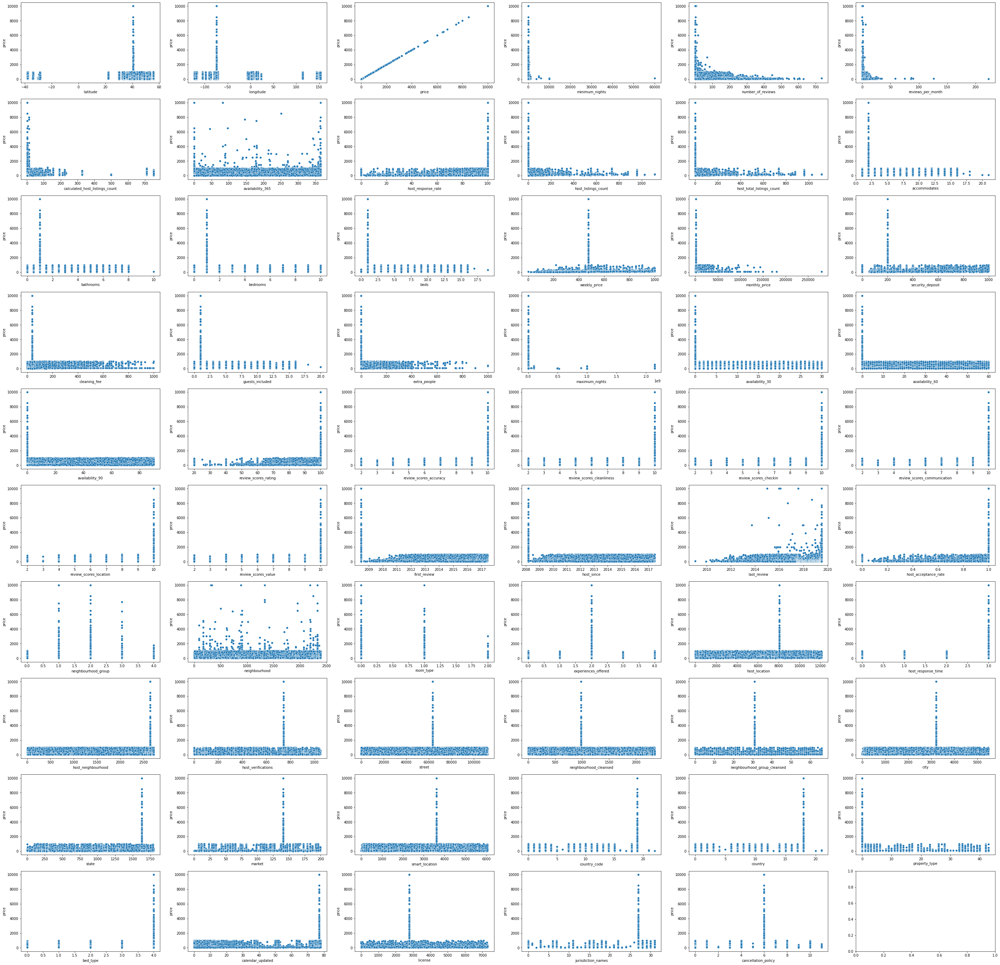

In [86]:
fig, ax = plt.subplots(10, 6, figsize = (50, 50))

i = 1
for col in airbnb_low_df.columns:
  plt.subplot(10, 6, i)
  sns.scatterplot(data = airbnb_low_df, x = col, y = 'price')
  i += 1

plt.show()

Nhận xét: Quan sát các biểu đồ scatterplot trên, ta nhận thấy: 
- Các thuộc tính không có quan hệ nhiều với "price" về dạng Linear.
- Các thuộc tính ảnh hưởng đến thuộc tính "price" dạng K-means.

Sau đó, ta sẽ sử dụng phương pháp Stepwise: Forward/Backward để chọn ra những đặc trưng phù hợp nhất sẽ sử dụng trong mô hình hồi quy.

In [87]:
def stepwise_selection(X, y, initial_list = [], threshold_in = 0.05, threshold_out = 0.05, verbose = True):
  included = list(initial_list)
  while True:
    changed = False

    # forward step
    excluded = list(set(X.columns) - set(included))
    new_pval = pd.Series(index = excluded)
    for new_column in excluded:
      model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included + [new_column]]))).fit()
      new_pval[new_column] = model.pvalues[new_column]
    best_pval = new_pval.min()
    if best_pval < threshold_in:
      best_feature = new_pval.idxmin()
      included.append(best_feature)
      changed = True
      if verbose:
        print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))
    
    # backward step
    model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
    # use all coefs except intercept
    pvalues = model.pvalues.iloc[:1]
    worst_pval = pvalues.max() # null if pvalues is empty
    if worst_pval > threshold_out:
      changed = True
      worst_feature = pvalues.idxmax()
      included.remove(worst_feature)
      if verbose:
        print('Drop  {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
    if not changed:
      break
  return included

X = airbnb_low_df[airbnb_low_df.columns.drop(['price', 'first_review', 'host_since', 'last_review'])]
y = airbnb_low_df['price']
result = stepwise_selection(X, y)

Add  beds                           with p-value 0.0
Add  extra_people                   with p-value 0.0
Add  accommodates                   with p-value 0.0
Add  review_scores_accuracy         with p-value 0.0
Add  review_scores_location         with p-value 0.0
Add  security_deposit               with p-value 0.0
Add  monthly_price                  with p-value 0.0
Add  reviews_per_month              with p-value 0.0
Add  bathrooms                      with p-value 0.0
Add  bedrooms                       with p-value 0.0
Add  cleaning_fee                   with p-value 0.0
Add  availability_90                with p-value 0.0
Add  availability_60                with p-value 9.03858e-187
Add  state                          with p-value 8.20372e-141
Add  guests_included                with p-value 2.21829e-135
Add  weekly_price                   with p-value 9.31156e-112
Add  country                        with p-value 2.70608e-94
Add  review_scores_rating           with p-value 3.6180

Theo phương pháp trên cho ta các cột sau có ảnh hưởng lớn đến việc xây dựng mô hình.

In [88]:
airbnb_low_df = airbnb_low_df[['price', 'first_review', 'host_since', 'last_review'] + result]

### Mô hình nào phù hợp để thực hiện yêu cầu dự đoán giá phòng (hồi qui, phân lớp, gom cụm)? Giải thích.

Do vậy, ta sẽ lần lượt thử nghiệm với từng loại mô hình đã học để tìm ra mô hình nào phù hợp nhất để dự đoán giá phòng:
- Hồi quy (ARIMA)
  - Đặt vấn đề: Dự đoán giá phòng dựa vào ngày cuối cùng review phòng.
  - Các thuộc tính sử dụng: "last_review", "price".
- Gom cụm (K-means)
  - Đặt vấn đề: Gom cụm các thuộc tính về việc review phòng để xác định loại giá phòng.
  - Các thuộc tính sử dụng: "review_scores_location", "reviews_per_month", "review_scores_rating", "review_scores_value", "number_of_reviews", "review_scores_cleanliness", "review_scores_checkin".
- Phân lớp (Decision Tree)
  - Đặt vấn đề: Dự đoán giá phòng dựa theo các đặc điểm của phòng với nhãn là loại giá phòng đã được gom cụm trước đó.
  - Các thuộc tính sử dụng: "accommodates", "bathrooms", "bedrooms", "beds", "cluster".

Sau đó sẽ so sánh đánh giá 2 mô hình Hồi quy (ARIMA) và Phân lớp (Decision Tree) để xem mô hình nào sẽ cho kết quả tốt hơn.

### Xây dựng mô hình dự đoán với giải pháp lựa chọn, và nêu phương pháp lựa chọn và đánh giá mô hình đã chọn?

#### 1. Mô hình hồi quy (ARIMA)

---

**Tiền xử lý dữ liệu:** Xử lý dữ liệu chuỗi thời gian

Trước tiên, ta sẽ loại bỏ một số cột không cần thiết và chỉ giữ lại 2 cột quan trọng cho mô hình là: "last_review" và "price" và lưu vào dataframe `airbnb_arima_df`.

In [89]:
airbnb_arima_df = airbnb_low_df[['last_review', 'price']]

Để tăng tính liên tục của thời gian, ta sẽ bổ sung các ngày còn thiếu với giá tiền mặc định là 0.

In [90]:
date_idx = pd.date_range(airbnb_arima_df['last_review'].min(), airbnb_arima_df['last_review'].max())
not_in_date_idx = date_idx[~date_idx.isin(airbnb_arima_df.index)]
airbnb_arima_df = airbnb_arima_df.append(pd.DataFrame({ 'last_review': not_in_date_idx, 'price': np.full(not_in_date_idx.size, 0)}))

Sau đó, gom nhóm các dòng có cùng tháng và năm và tính số tiền trung bình của từng tháng đó.

In [91]:
airbnb_arima_df = airbnb_arima_df.groupby(pd.Grouper(key = 'last_review', freq = 'MS')).mean()

Xem thử tập dữ liệu sau khi đã tiền xử lý.

In [92]:
airbnb_arima_df.head()

,price
last_review,
2009-01-01,7.333333
2009-02-01,0.000000
2009-03-01,0.000000
2009-04-01,0.000000
2009-05-01,0.000000


---

Trước tiên, ta cần xem xét chuỗi thời gian xem nó có tính dừng hay không. Bước này có thể được thực hiện bằng cách tính hàm tự tương quan (ACF) và hàm tự tương quan riêng phần (PACF). Ta sẽ trực quan hóa bằng các biểu đồ tương quan gắn với ACF và PACF.

Nếu chuỗi thời gian không có tính dừng, lấy sai phân của nó 1 hay nhiều lần để làm cho
nó có tính dừng.


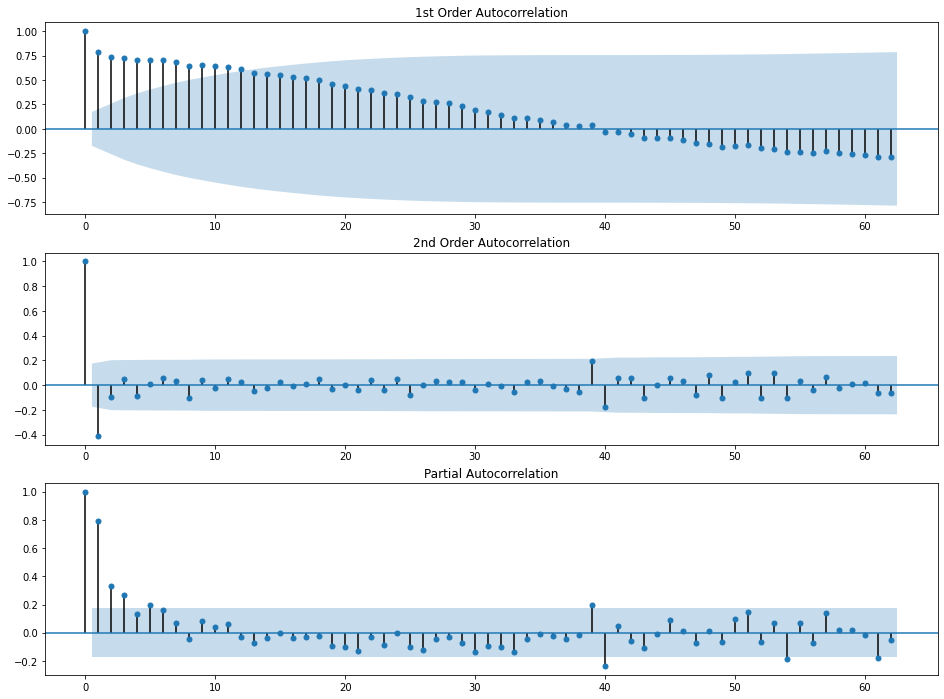

In [93]:
fig, ax = plt.subplots(3, 1, figsize = (16, 12))
fig = plot_acf(airbnb_arima_df['price'], lags = 62, ax = ax[0], title = '1st Order Autocorrelation')
fig = plot_acf(airbnb_arima_df['price'].diff().dropna(), lags = 62, ax = ax[1], title = '2nd Order Autocorrelation')
fig = plot_pacf(airbnb_arima_df['price'].dropna(), lags = 62, ax = ax[2])
plt.show()

Nhận xét: Quan sát từ 2 biểu đồ trên (ACF và PACF), lần đầu tiên của biểu đồ ACF chưa thấy xuất hiện tính dừng vì biểu đồ thay đổi giá trị liên tục từ cao xuống thấp. Do đó ta lấy đạo hàm 1 lần cho biểu đồ ACF để thấy được tính dừng. Tương tự với biểu đồ PACF ta thấy được tính dừng của chuỗi thời gian lần đầu tiên.

Từ đó có thể lựa chọn được các tham số của mô hình ARIMA(p, d, q) như sau:
- p = 2 là bậc của đồ thị AR. Xét từ độ trễ đầu tiên, thanh nào nằm ngoài đường giới hạn và sau độ giảm một cách đáng kể sau một độ trễ.
- d = 1 là bậc sai phân, trong trường hợp này sai phân cách nhau 1 tháng.
- q = 1 là bậc của đồ thị MA. Xét từ độ trễ đầu tiên, thanh nào nằm ngoài đường giới hạn và sau độ tăng một cách đáng kể sau một độ trễ.

Thực hiện xây dựng mô hình ARIMA và in ra tóm tắt kết quả chạy mô hình bằng các thông số mô tả.

In [94]:
# Chia thành 2 tập train và test với tỉ lệ 70/30
split_point = int(airbnb_arima_df.shape[0] * 0.7)
X = airbnb_arima_df[:split_point]
y = airbnb_arima_df[split_point:]

# Xây dựng mô hình ARIMA
model = ARIMA(X, order = (2, 1, 1))
model_fit = model.fit()

# Tóm tắt kết quả mô hình
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.price   No. Observations:                   87
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -381.678
Method:                       css-mle   S.D. of innovations             19.368
Date:                Fri, 06 Jan 2023   AIC                            773.357
Time:                        08:09:06   BIC                            785.686
Sample:                    02-01-2009   HQIC                           778.321
                         - 04-01-2016                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.6571      0.612      2.707      0.007       0.457       2.857
ar.L1.D.price    -0.1248      0.167     -0.747      0.455      -0.453       0.203
ar.L2.D.price     0.0077      0.143     

Dự đoán kết quả chạy mô hình trên tập test với 95% tin cậy.

In [95]:
# Dự đoán trên tập test với 95% tin cậy
fc, se, conf = model_fit.forecast(airbnb_arima_df.shape[0] - split_point, alpha = 0.05)

Sau đó, để so sánh giữa kết quả dự đoán từ mô hình với kết quả thực tế trên tập test, ta sẽ vẽ biểu đồ đường thể hiện kết quả dự đoán giá phòng ("price") dựa vào "last_review". Trong đó:
- Trục tung: giá phòng
- Trục hoành: ngày review cuối cùng

Các đường màu thể hiện các ý nghĩa khác nhau:
- Màu xanh dương: giá phòng của tập train.
- Màu cam: giá phòng của tập test.
- Màu xanh lá: giá phòng được dự đoán từ mô hình.

Khoảng màu xám thể hiện cận trên và cận dưới giao động trong việc dự đoán mô hình.

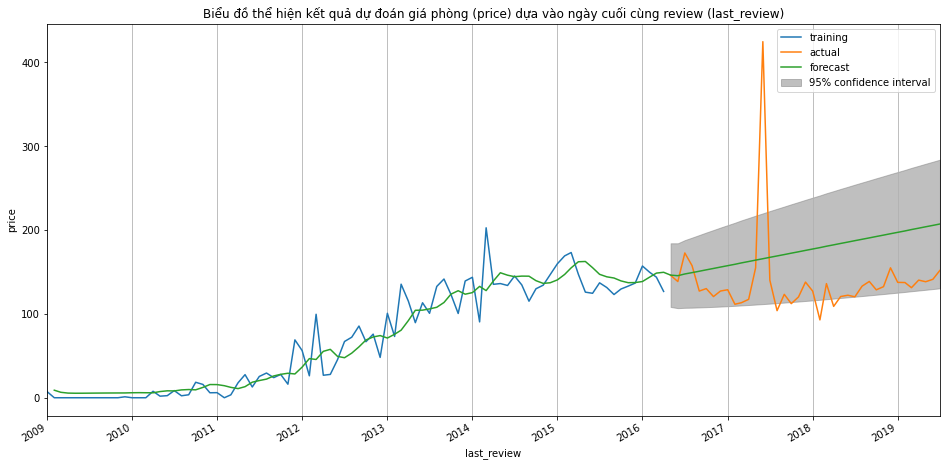

In [96]:
# Tạo Series cho biểu đồ
fc_series = pd.Series(fc, index = y.index)
lower_series = pd.Series(conf[:, 0], index = y.index)
upper_series = pd.Series(conf[:, 1], index = y.index)

# Vẽ biểu đồ trực quan hóa
fig, ax = plt.subplots(figsize = (16, 8))
plt.plot(X, label = 'training')
plt.plot(y, label = 'actual')
fig = model_fit.plot_predict(end = y.index[y.size - 1], dynamic = False, plot_insample = False, ax = ax)
plt.xlim(airbnb_arima_df.index.min(), airbnb_arima_df.index.max())
plt.title('Biểu đồ thể hiện kết quả dự đoán giá phòng (price) dựa vào ngày cuối cùng review (last_review)')
plt.xlabel('last_review')
plt.ylabel('price')
plt.legend()
plt.grid(axis = 'x')
plt.show()

Nhận xét: Quan sát biểu đồ đường ta thấy kết quả dự đoán giá phòng (forecast) có sự tương đồng so với tập dữ liệu thực tế (actual) trong 60 ngày cuối. Ngoài ra còn nhận thấy sự tăng dần của giá phòng theo từng năm chứng tỏ sự tương quan giữa "price" và "last_review" càng cao thì giá phòng càng tăng theo.

Ta sẽ đánh giá mô hình ARIMA dựa vào các độ đo 'Good-Of-Fit' cho mô hình như: ME, MAE, MPE, MAPE, MSE, RMSE, R2, ACF1.

In [97]:
def mean_error(y_test, y_pred):
  return np.mean(y_pred - y_test)
def mean_percentage_error(y_test, y_pred):
  return np.mean((y_pred - y_test) / y_test)
def root_mean_squared_error(y_test, y_pred):
  return sqrt(mean_squared_error(y_test, y_pred))
y_test = airbnb_arima_df[split_point:]['price'].values
y_pred = fc_series.values

# The mean error
print('Mean error (ME):                           %.4f' % mean_error(y_test, y_pred))
# The mean absolute error
print('Mean absolute error (MAE):                 %.4f' % mean_absolute_error(y_test, y_pred))
# The mean percentage error
print('Mean percentage error (MPE):               %.4f' % mean_percentage_error(y_test, y_pred))
# The mean absolute percentage error
print('Mean absolute percentage error (MAPE):     %.4f' % mean_absolute_percentage_error(y_test, y_pred))
# The mean squared error
print('Mean squared error (MSE):                  %.4f' % mean_squared_error(y_test, y_pred))
# The root mean squared error
print('Root mean squared error (RMSE):            %.4f' % root_mean_squared_error(y_test, y_pred))
# The R squared
print('R-Square (R2):                             %.4f' % r2_score(y_test, y_pred))
# The autocorrelation of errors at lag 1
print('Autocorrelation of errors at lag 1 (ACF1): %.4f' % acf(fc - y_test)[1])

Mean error (ME):                           37.2379
Mean absolute error (MAE):                 52.2299
Mean percentage error (MPE):               0.3375
Mean absolute percentage error (MAPE):     0.3790
Mean squared error (MSE):                  4258.9700
Root mean squared error (RMSE):            65.2608
R-Square (R2):                             -0.7773
Autocorrelation of errors at lag 1 (ACF1): 0.2536


Ta sẽ đánh giá mô hình dựa vào độ đo R squared.

In [98]:
# Accuracy
accuracy_arima_low = r2_score(y_test, y_pred)
print(f'Mô hình dự đoán với độ chính xác là: {accuracy_arima_low}')

Mô hình dự đoán với độ chính xác là: -0.7773361534266501


#### 2. Mô hình gom cụm (K-means)

---

**Tiền xử lý dữ liệu:** Chuẩn hóa dữ liệu

Trước tiên, ta sẽ loại bỏ một số cột không cần thiết và chỉ giữ lại các cột quan trọng cho mô hình là: "review_scores_location", "reviews_per_month", "review_scores_rating", "review_scores_value", "number_of_reviews", "review_scores_cleanliness", "review_scores_checkin" và lưu vào dataframe `airbnb_kmeans_df`.

In [99]:
airbnb_kmeans_df = airbnb_low_df[['review_scores_location', 'reviews_per_month', 'review_scores_rating', 'review_scores_value', 'number_of_reviews', 'review_scores_cleanliness', 'review_scores_checkin']]

Sau đó, ta sẽ chuẩn hóa dữ liệu theo kiểu min-max để ước tính chia tỉ lệ của từng cột riêng lẻ sao cho nó nằm trong khoảng từ 0 đến 1.

In [100]:
scaler = MinMaxScaler()
new_airbnb_kmeans_data = scaler.fit_transform(airbnb_kmeans_df)
airbnb_kmeans_df = pd.DataFrame(new_airbnb_kmeans_data, columns = airbnb_kmeans_df.columns)

Xem thử tập dữ liệu sau khi đã tiền xử lý.

In [101]:
airbnb_kmeans_df.head()

,review_scores_location,reviews_per_month,review_scores_rating,review_scores_value,number_of_reviews,review_scores_cleanliness,review_scores_checkin
0,1.0,0.000897,1.0,1.0,0.012245,1.0,1.0
1,1.0,0.001659,1.0,1.0,0.061224,1.0,1.0
2,1.0,0.003857,1.0,1.0,0.000000,1.0,1.0
3,1.0,0.020763,1.0,1.0,0.367347,1.0,1.0
4,1.0,0.000404,1.0,1.0,0.012245,1.0,1.0


---

Đầu tiên, ta sử dụng phương pháp Elbow để tìm k (số cluster) phù hợp nhất để xây dựng mô hình.

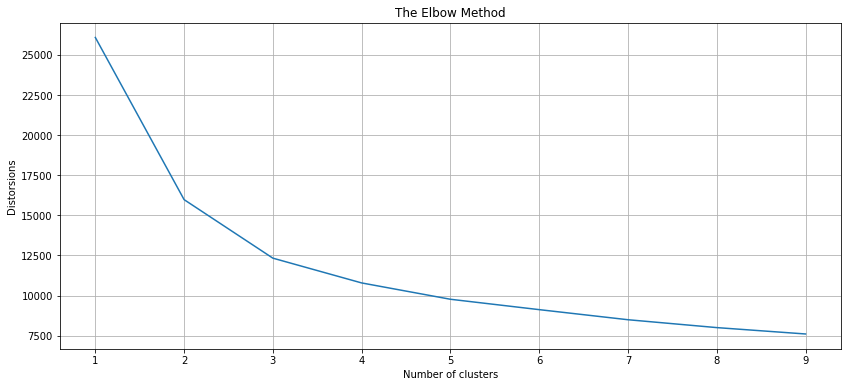

In [102]:
distorsions = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(airbnb_kmeans_df)
    distorsions.append(kmeans.inertia_)
plt.figure(figsize = (14, 6))
plt.plot(range(1, 10), distorsions)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Distorsions')
plt.grid()
plt.show()

Nhận xét: Theo biểu đồ trên, chúng ta có thể thấy một đường gấp khúc tại **k = 2**. Do đó **k = 2** có thể được xem là 1 giá trị tốt của mô hình K-means để gom cụm dữ liệu.

Thực hiện xây dựng mô hình K-means và tìm các điểm trung tâm gom cụm.

In [103]:
# Chia thành 2 tập train và test với tỉ lệ 70/30
X = airbnb_kmeans_df.copy()

# Xây dựng mô hình K-means
model = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
model_fit = model.fit(X)

# Gán cụm cho tập dữ liệu
airbnb_kmeans_df['cluster'] = model.labels_

# Tìm các điểm trung tâm gom cụm
print('Cluster centers:')
print(model.cluster_centers_)

Cluster centers:
[[0.86358184 0.00574826 0.7977057  0.80648612 0.0297146  0.78177559
  0.89115519]
 [0.97687185 0.0059249  0.97324951 0.97475506 0.02217828 0.98093075
  0.99341476]]


Để dễ trực quan hơn, ta sẽ vẽ biểu đồ scatterplot để thể hiện các gom cụm của dữ liệu. Trong đó:
- Trục tung: component 1
- Trục hoành: component 2

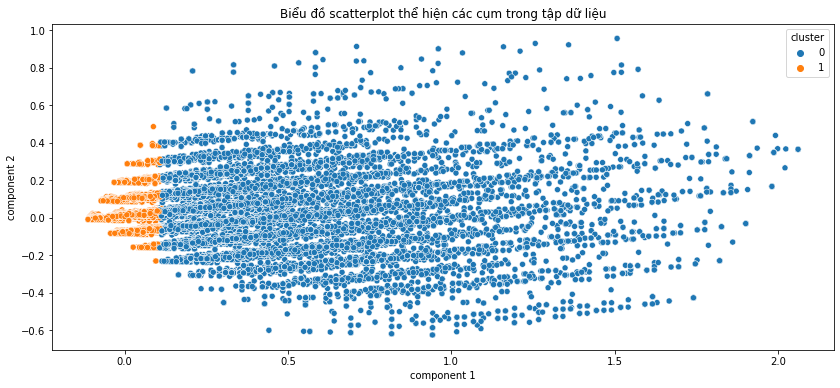

In [104]:
# Giảm chiều dữ liệu
pca = PCA(n_components = 2)
pca_df = pd.DataFrame(pca.fit_transform(airbnb_kmeans_df[airbnb_kmeans_df.columns.drop(['cluster'])]), columns = ['component 1', 'component 2'])
pca_df['cluster'] = airbnb_kmeans_df['cluster']

# Vẽ biểu đồ trực quan hóa
plt.figure(figsize = (14, 6))
sns.scatterplot(data = pca_df, x = 'component 1', y = 'component 2', hue = 'cluster').set_title('Biểu đồ scatterplot thể hiện các cụm trong tập dữ liệu')
plt.show()

Nhận xét: Quan sát biểu đồ trên, ta có thể thấy các cụm dữ liệu được chia thành 2 cụm riêng biệt:
- Cụm 0 (màu xanh): Nằm ở phía bên phải, chiếm 1/4 số lượng mẫu -> Thể hiện cho các phòng thuộc giá thấp.
- Cụm 1 (Màu cam): Nằm ở phía bên trái, chiếm 3/4 số lượng mẫu -> Thể hiện cho các phòng thuộc giá cao.

#### 3. Mô hình phân lớp (Decision Tree)

---

**Tiền xử lý dữ liệu:** Loại bỏ các cột không cần thiết

Trước tiên, ta sẽ loại bỏ một số cột không cần thiết và chỉ giữ lại các cột quan trọng cho mô hình là: "room_type", "accommodates", "bathrooms", "bedrooms", "beds", "cluster" và lưu vào dataframe `airbnb_decision_tree_df`.

In [105]:
airbnb_decision_tree_df = airbnb_low_df[['accommodates', 'bathrooms', 'bedrooms', 'beds']]
airbnb_decision_tree_df['cluster'] = airbnb_kmeans_df['cluster']

Xem thử tập dữ liệu sau khi đã tiền xử lý.

In [106]:
airbnb_decision_tree_df.head()

,accommodates,bathrooms,bedrooms,beds,cluster
0,2,1.0,1,1,1
1,2,1.0,1,1,1
2,2,1.0,1,1,1
3,2,1.0,1,1,1
4,2,1.0,1,1,1


---

Thực hiện xây dựng mô hình Decision Tree.

In [107]:
# Chia thành 2 tập train và test với tỉ lệ 70/30
feature_cols = airbnb_decision_tree_df.columns.drop(['cluster'])
X = airbnb_decision_tree_df[feature_cols]
y = airbnb_decision_tree_df['cluster']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)

# Xây dựng mô hình Decision Tree
clf = DecisionTreeClassifier()
clf = clf.fit(X_train, y_train)

Dự đoán kết quả chạy mô hình trên tập test.

In [108]:
# Dự đoán dữ liệu trên tập test
y_pred = clf.predict(X_test)

Ta sẽ trực quan hóa mô hình bằng cây quyết định để thấy được các nhánh cũng như sự phân lớp của cây.

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.189742 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.189742 to fit



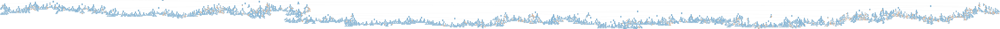

In [109]:
# Vẽ biểu đồ trực quan hóa
dot_data = StringIO()
export_graphviz(clf, out_file = dot_data, filled = True, rounded = True, special_characters = True, feature_names = feature_cols, class_names = ['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('decision_tree.png')
Image(graph.create_png())

Ta sẽ đánh giá mô hình Decision Tree dựa vào các độ đo cho mô hình như: Confusion Matrix, Accuracy, Precision, Recall, F-score

Accuracy:    0.8293
Precision:   0.8311
Recall:      0.9972
F-score:     0.9066
R-Square:    -0.2159
Confusion Matrix:


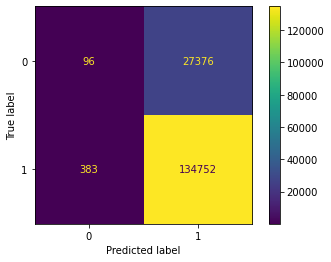

In [110]:
def plot_confusion_matrix(y_test, y_pred):
  disp = ConfusionMatrixDisplay(confusion_matrix = confusion_matrix(y_test, y_pred))
  disp.plot()
  plt.show()

# Accuracy
print('Accuracy:    %.4f' % accuracy_score(y_test, y_pred))
# Precision
print('Precision:   %.4f' % precision_score(y_test, y_pred))
# Recall
print('Recall:      %.4f' % recall_score(y_test, y_pred))
# F-score
print('F-score:     %.4f' % f1_score(y_test, y_pred))
# R squared
print('R-Square:    %.4f' % r2_score(y_test, y_pred))
# Confusion matrix
print('Confusion Matrix:')
plot_confusion_matrix(y_test, y_pred)

Ta sẽ đánh giá mô hình dựa vào độ đo R squared.

In [111]:
# Accuracy
accuracy_decision_tree_low = r2_score(y_test, y_pred)
print(f'Mô hình dự đoán với độ chính xác là: {accuracy_decision_tree_low}')

Mô hình dự đoán với độ chính xác là: -0.2158638059992164


# D. ĐÁNH GIÁ MÔ HÌNH

### Dự đoán lần lượt với hai cách xử lý giá ở trên thì cái nào cho kết quả tốt hơn?

Với 2 cách xử lý ở trên. Ta sẽ so sánh độ chính xác (accuracy) của từng mô hình với từng cách xử lý giá mà ta đã tính ở trên. Sau đó lưu lại vào dataframe `statistic_model_df`.

In [112]:
accuracy_dict = { 'High price': [accuracy_arima_high, accuracy_decision_tree_high],
                  'Low price': [accuracy_arima_low, accuracy_decision_tree_low] }
statistic_model_df = pd.DataFrame(accuracy_dict, index = ['ARIMA', 'Decision Tree'])
statistic_model_df

,High price,Low price
ARIMA,-0.751008,-0.777336
Decision Tree,-0.215995,-0.215864


Nhận xét: Ta đều thấy với từng mô hình học máy như ARIMA, K-means, Decision Tree đều cho ta tỉ lệ chính xác theo cách xử lý giá thấp thì cao hơn giá cao mặc dù không chêch lệch nhiều. Điều đó cho thấy cách xử lý missing value bằng giá thấp sẽ có hiệu quả tốt hơn so với cách xử lý missing value bằng giá cao. Ngoài ra, cũng tùy tình huống sử dụng và nhu cầu của người dùng mà ta lựa chọn mô hình phù hợp. Cụ thể:
- Nếu muốn tăng tính chính xác một con số cụ thể và dự đoán giá phòng trong tương lai thì nên dùng mô hình ARIMA mặc dù có độ chính xác không cao.
- Nếu muốn nhận diện nhãn hoặc phân biệt giá cao và giá thấp thì nên dùng mô hình K-means hay Decision Tree vì có độ chính xác khá cao.